# W11 Lab Exercise

This is the lab exercise for **MIS590: Information Retrieval**.  
In this lab, you will gain the following experience:

- **Understand how to train a classifier with a publicly available dataset**:
    - Evaluate the model performance by comparing its output with expected relevance results.
    - Determine the best parameter settings for the model.

- **Understand how to train a clustering model**:
    - Identify the number of clusters that yield the best clustering results.
    - Evaluate the clustering model's performance.
    - Visualize the clustering results.

**Note:** When you see a pencil icon ✏️ in this notebook, it's time for you to code or answer the question!


# 1. Preliminaries
## 1.1 Install and Import libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Install necessary packages
!pip install wordcloud
!pip install scikit-learn
!pip install nltk
!pip install seaborn
!pip install gensim

  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)


In [2]:
# Data handling and numerical operations
import pandas as pd
import numpy as np

# Dataset
from sklearn.datasets import fetch_20newsgroups

# String operations and text preprocessing
import re
import string
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Feature extraction
from sklearn.feature_extraction.text import TfidfVectorizer

# Classification models
from sklearn.svm import LinearSVC, SVC
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

# Clustering models
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Dimensionality reduction
from sklearn.decomposition import PCA

# Hyperparameter tuning
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit

# Evaluation metrics
from sklearn import metrics
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    classification_report,
    silhouette_score,
    davies_bouldin_score
)

# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure
import matplotlib.ticker as ticker
from wordcloud import WordCloud

# Text representation and word embeddings
from gensim.models import Word2Vec

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Visualization configuration
%matplotlib inline
mpl.style.use('ggplot')
plt.style.use('fivethirtyeight')
sns.set(context="notebook", palette="dark", style='whitegrid', color_codes=True)
params = {
    'axes.labelsize': "large",
    'xtick.labelsize': 'x-large',
    'legend.fontsize': 20,
    'figure.dpi': 150,
    'figure.figsize': [25, 7]
}
plt.rcParams.update(params)

In [3]:
nltk.download('punkt_tab')
nltk.download('stopwords')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

## 1.2 Dataset Preparation

✏️ Research online and find details about the 20 Newsgroups dataset.

- What is the objective task of this dataset?

A:
文章分類（書、課本、社群網站的power、新聞），這個主要是新聞文章做20個分類：商業、體育、汽車等等，把新聞分到二十個類別
- Each instance is an article. What kind of article?  

A:
每篇文章都是從 Usenet 新聞群組中抓的，這些新聞是來自之前主題討論的網路論壇，文章內容包括技術建議、個人觀點、辯論和資訊貼文，這些新聞都是使用者感興趣的特定主題或類別。
- There are 20 categories these articles belong to. What are these 20 categories?  

A:
alt.atheism
comp.graphics
comp.os.ms-windows.misc
comp.sys.ibm.pc.hardware
comp.sys.mac.hardware
comp.windows.x
misc.forsale
rec.autos
rec.motorcycles
rec.sport.baseball
rec.sport.hockey
sci.crypt
sci.electronics
sci.med
sci.space
soc.religion.christian
talk.politics.guns
talk.politics.mideast
talk.politics.misc
talk.religion.misc

### 1.2.1 Data Splitting

In [4]:
# 17 chosen categories for classification
categories = [
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc'
]

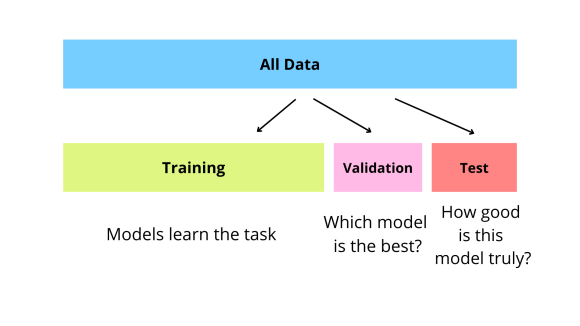
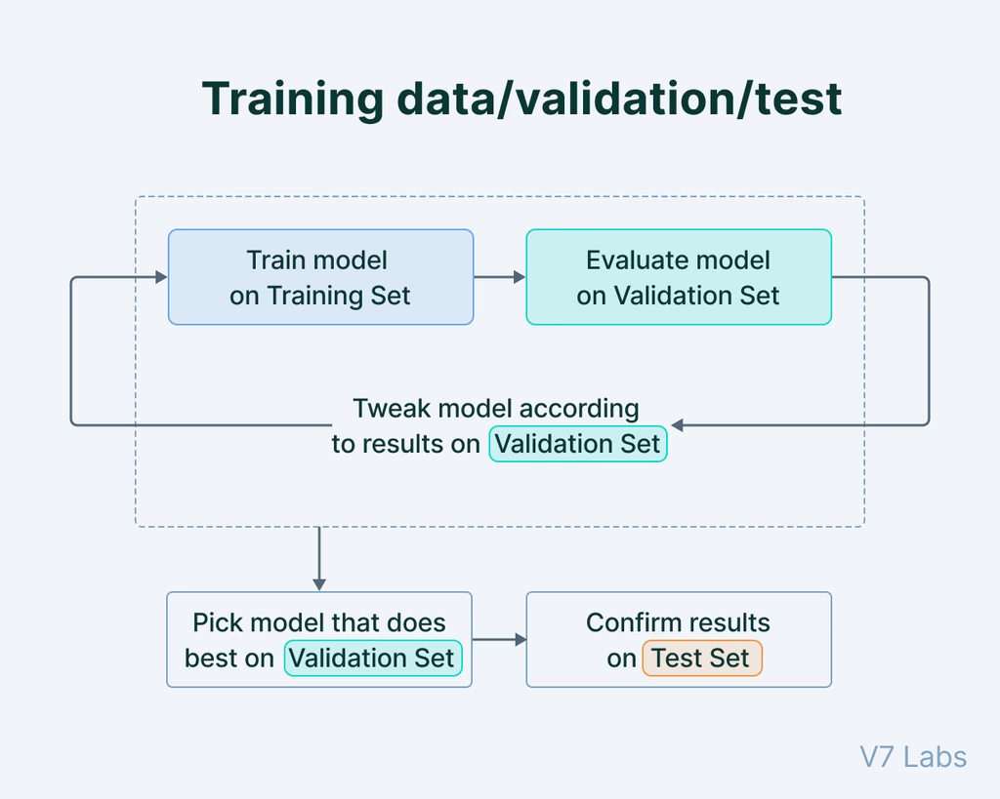

In [5]:
# fetching the training and testing data
total_training_data = fetch_20newsgroups(subset='train', categories=categories, remove=('headers', 'footers', 'quotes'), shuffle=True)
total_testing_data = fetch_20newsgroups(subset='test', categories=categories, remove=('headers', 'footers', 'quotes'),shuffle=True)

In [10]:
# viewing the number of documents in the training and testing data
print("Total training data:",len(total_training_data['data']))
print("Total testing data:",len(total_testing_data['data']))

Total training data: 9650
Total testing data: 6425


In [11]:
def count_per_class(training_data, categories):
  """
  Function to return the number of documents per class
  """
  count_list=[]
  for i in range(len(categories)):
    boolean_value=(training_data['target'] == i)
    count=0
    for i in boolean_value:
      if i==True:
        count+=1
    count_list.append(count)
  class_count = {}
  for i in range(len(count_list)):
    class_count[categories[i]]=count_list[i]
  return class_count

In [12]:
# viewing the count of documents per category
count_per_category = count_per_class(total_training_data,categories)
count_per_category

{'comp.graphics': 584,
 'comp.os.ms-windows.misc': 591,
 'comp.sys.ibm.pc.hardware': 590,
 'comp.sys.mac.hardware': 578,
 'comp.windows.x': 593,
 'rec.autos': 594,
 'rec.motorcycles': 598,
 'rec.sport.baseball': 597,
 'rec.sport.hockey': 600,
 'sci.crypt': 595,
 'sci.electronics': 591,
 'sci.med': 594,
 'sci.space': 593,
 'talk.politics.guns': 546,
 'talk.politics.mideast': 564,
 'talk.politics.misc': 465,
 'talk.religion.misc': 377}

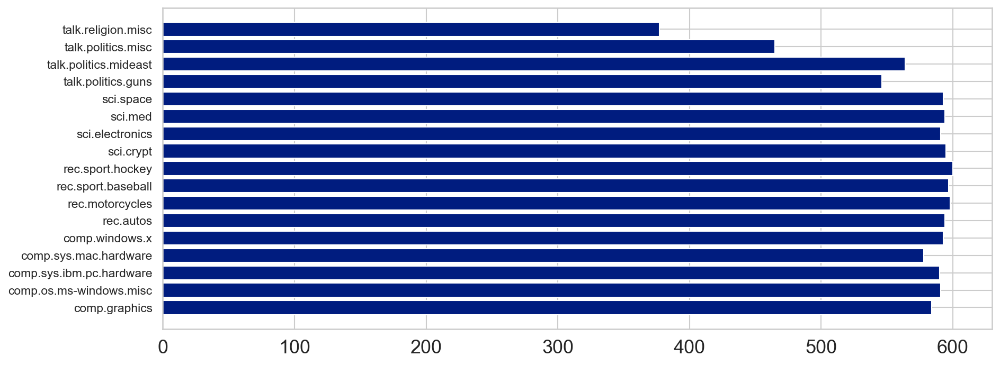

In [13]:
# plotting the count of documents per category
plt.figure(figsize=(12, 5))
category = list(count_per_category.keys())
count = list(count_per_category.values())
plt.barh(range(len(count_per_category)), count, tick_label=category)
plt.show()

### ✏️ Observe the results above and discuss the following:
- What are the majority classes? What are the minority classes?

A:
從圖表可以看出，像 rec.sport.hockey 和 sci.space 等類別屬於majority classes
像是talk.religion.misc 和 talk.politics.misc 等類別的為minority classes

- How does the imbalanced nature of class distribution affect the classification results?

在類別不平衡的情況下，模型會偏向多數類別，因為它們對損失的影響更大，類別分佈不平衡會顯著影響分類器的性能和泛化能力，因此在訓練和評估分類模型時需要考慮怎麼處理這種情形，來提高模型對所有類別的預測效果

In [15]:
# accesing the features and target
X_train_data = pd.DataFrame(total_training_data['data'], columns=["post"])
y_train = pd.DataFrame(total_training_data['target'])
X_test_data = pd.DataFrame(total_testing_data['data'], columns=["post"])
y_test = pd.DataFrame(total_testing_data['target'])

In [16]:
# viewing the training data
X_train_data

,post
0,\n\nThere were many injustices in the middle a...
1,\n\nThis actually supports Bill's speculation ...
2,\nApplied Engineering makes a NuBus card calle...
3,Mark McWiggins <markmc@halcyon.com> reminds us...
4,"\nExcellently put!\n\nEven as a libertarian, I..."
...,...
9645,\nAll Toyotas have airbags with a real horn. C...
9646,HELP!\nMaybe anybody know names of conferenc...
9647,\nI'm not aware that the US government conside...
9648,"\n Nut or not, he was clearly a liar. He sai..."


In [17]:
# viewing the testing data
y_test

,0
0,10
1,12
2,4
3,13
4,2
...,...
6420,0
6421,12
6422,2
6423,15


### 1.2.2 Data Preprocessing

In [18]:
def preprocess_post(post):
  """
  Function to preprocess the post which involves removing URL,
  removing special characters, numbers, extra spaces, etc
  """
  post = re.sub(r'\S*https?:\S*', '', post)
  post = re.sub('[^A-Za-z]+', ' ', post)

  altered_post_words = []
  for word in post.split():
    if word.lower() not in stopwords.words("english"):
      altered_post_words.append(word)
  
  post = ' '.join(altered_post_words)

  post = post.lower()

  post = post.strip()

  return post

In [19]:
# viewing the newly added feature i.e. preprocessed_post from the training data
X_train_data

,post
0,\n\nThere were many injustices in the middle a...
1,\n\nThis actually supports Bill's speculation ...
2,\nApplied Engineering makes a NuBus card calle...
3,Mark McWiggins <markmc@halcyon.com> reminds us...
4,"\nExcellently put!\n\nEven as a libertarian, I..."
...,...
9645,\nAll Toyotas have airbags with a real horn. C...
9646,HELP!\nMaybe anybody know names of conferenc...
9647,\nI'm not aware that the US government conside...
9648,"\n Nut or not, he was clearly a liar. He sai..."


In [20]:
# creating a new column that has preprocessed posts
X_train_data['preprocessed_post'] = X_train_data['post'].apply(lambda x: preprocess_post(x))
X_test_data['preprocessed_post'] = X_test_data['post'].apply(lambda x: preprocess_post(x))

In [21]:
X_train_data

,post,preprocessed_post
0,\n\nThere were many injustices in the middle a...,many injustices middle ages truely sad would h...
1,\n\nThis actually supports Bill's speculation ...,actually supports bill speculation backdoor rs...
2,\nApplied Engineering makes a NuBus card calle...,applied engineering makes nubus card called qu...
3,Mark McWiggins <markmc@halcyon.com> reminds us...,mark mcwiggins markmc halcyon com reminds us m...
4,"\nExcellently put!\n\nEven as a libertarian, I...",excellently put even libertarian admit governm...
...,...,...
9645,\nAll Toyotas have airbags with a real horn. C...,toyotas airbags real horn come hard put little...
9646,HELP!\nMaybe anybody know names of conferenc...,help maybe anybody know names conferences plea...
9647,\nI'm not aware that the US government conside...,aware us government considers dangerous case n...
9648,"\n Nut or not, he was clearly a liar. He sai...",nut clearly liar said would surrender local ra...


In [22]:
X_test_data

,post,preprocessed_post
0,I have a question about accessing certain addr...,question accessing certain addresses chip part...
1,What are those other objects? UFOs????\n,objects ufos
2,\nYou have to do the same sorts of things that...,sorts things xt main loop rig timer queue put ...
3,\nAssuming the fire was caused by lanterns and...,assuming fire caused lanterns stoves knocked t...
4,: Just curious why floptical drives never seem...,curious floptical drives never seemed catch re...
...,...,...
6420,----------------------------------------------...,call papers eighth international symposium com...
6421,"Sorry, I've lost track of who asked the questi...",sorry lost track asked question originally new...
6422,I need to find how to program the WD7000 FAAST...,need find program wd faast scsi controller bit...
6423,"# #From the Santa Rosa (Cal.) Press-Democrat, ...",santa rosa cal press democrat april p b male s...


## 1.3 Vectorization

### 1.3.1 TF-IDF

In [23]:
# initialize the vectorizer for word importance
vectorizer = TfidfVectorizer(min_df=5, max_df=0.95)

# applying the vectorizer to the preprocessed posts
X_train_tfidf = vectorizer.fit_transform(X_train_data['preprocessed_post'])
X_test_tfidf = vectorizer.transform(X_test_data['preprocessed_post'])

In [24]:
# viewing the sparse matrix representation of the features in the training data
X_train_tfidf.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

### ✏️ Observe the results above and discuss the following:
- What are the parameters that we can set for the TfidfVectorizer?

A:

min_df, max_df, stop_words, ngram_range, max_features, use_idf, smooth_idf, norm, sublinear_tf

- How can we find the best parameter setting?

A: 

Grid Search：對多組參數進行系統化搜尋，找出對模型性能最優的參數

交叉驗證：使用交叉驗證評估不同參數設置下的模型性能

手動調整：根據數據集特性和目標，嘗試多組參數，像是如果文檔較短，減少min_df，而考慮詞組的語義關係的話，可以調整ngram_range。

評估指標：像是F1、精確率、召回率）比較不同參數對模型的影響

資料探索：分析詞頻分佈（如高頻詞和低頻詞的比例）來設定min_df和max_df

### 1.3.2 Word2Vec

In [25]:
tokenized_documents = [word_tokenize(doc) for doc in X_train_data['preprocessed_post']]

# Train Word2Vec model
word2vec_model = Word2Vec(sentences=tokenized_documents, vector_size=128, window=5, min_count=2, workers=10)

In [26]:
# Compute document embeddings by averaging word vectors
def document_embedding(doc):
    vectors = [word2vec_model.wv[word] for word in word_tokenize(doc) if word in word2vec_model.wv]
    if vectors:  # Avoid empty lists
        return np.mean(vectors, axis=0)
    else:
        return np.zeros(word2vec_model.vector_size)  # Default zero vector for empty documents

# applying the vectorizer to the preprocessed posts
X_train_w2v = [document_embedding(doc) for doc in X_train_data['preprocessed_post']]
X_test_w2v = [document_embedding(doc) for doc in X_test_data['preprocessed_post']]

In [27]:
np.array(X_train_w2v)

array([[-0.11886638, -0.06840643,  0.39078492, ..., -0.19720279,
         0.11198282,  0.22425954],
       [-0.39559472, -0.11086412,  0.33644027, ..., -0.2851375 ,
         0.02140471,  0.16041677],
       [-0.32177183, -0.09902453,  0.27518108, ..., -0.42157176,
         0.18027407,  0.21542045],
       ...,
       [-0.23902906,  0.03095153,  0.38144985, ..., -0.27277482,
        -0.06846877,  0.19792138],
       [-0.05613544, -0.06935851,  0.30488953, ..., -0.24729547,
         0.11939449,  0.19400761],
       [-0.25099161, -0.02127324,  0.3636893 , ..., -0.77120638,
         0.04957037,  0.04148936]])

# 2. Classification

In [28]:
# defining the classification models
classification_models = ['K Nearest Neighbor', 'K Nearest Neighbor Hypertuned', 'Support Vector Machine', 'Support Vector Machine Hypertuned', 'Multinomial Naive Bayes', 'Multinomial Naive Bayes Hypertuned', 'Logistic Regression Multiclass', 'Logistic Regression One-vs-all']

In [29]:
# initializing lists to track the training and testing accuracies
all_category_train_accuracy = []
all_category_test_accuracy = []

In [30]:
# initializing lists to track performance metrics
all_precision_score = []
all_recall_score = []
all_f1_score = []

**Use TF-IDF as document features**

In [31]:
X_train = X_train_tfidf
X_test = X_test_tfidf
# X_train = X_train_w2v
# X_test = X_test_w2v

## 2.1 K-Nearest Neighbour Classifier


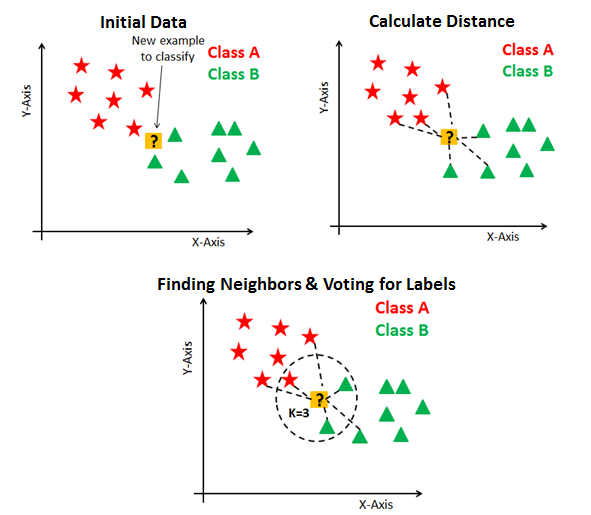

### 2.1.1 Training

In [32]:
# initializing and fitting the KNN Classifier
all_knn_clf = KNeighborsClassifier(n_neighbors=4)
all_knn_clf.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=4)

### ✏️ Observe the results above and discuss the following:
- What does the parameter n_neighbors do?

A:

n_neighbors 指定了分類時的鄰近點數量，KNN 分類器會根據這些鄰居的類別，通過多數決來決定測試樣本的分類，小的n_neighbors會讓模型更加靈活，能抓到數據的細節，但可能會Overfitting，對噪聲更敏感，大的 n_neighbors會讓模型分類決策受更多數據影響，可能導致Underfitting，忽略數據的細節

### 2.1.2 Evaluation

In [33]:
# calculating training accuracy
all_knn_train_prediction = all_knn_clf.predict(X_train)
all_knn_train_accuracy = accuracy_score(y_train,all_knn_train_prediction)
print("Training Accuracy:", all_knn_train_accuracy*100)
all_category_train_accuracy.append(all_knn_train_accuracy)

# calculating testing accuracy
all_knn_test_prediction = all_knn_clf.predict(X_test)
all_knn_test_accuracy = accuracy_score(y_test, all_knn_test_prediction)
print("Testing Accuracy:", all_knn_test_accuracy*100)
all_category_test_accuracy.append(all_knn_test_accuracy)

Training Accuracy: 41.61658031088083
Testing Accuracy: 9.26070038910506


**Confusion Matric (Binary Class)**

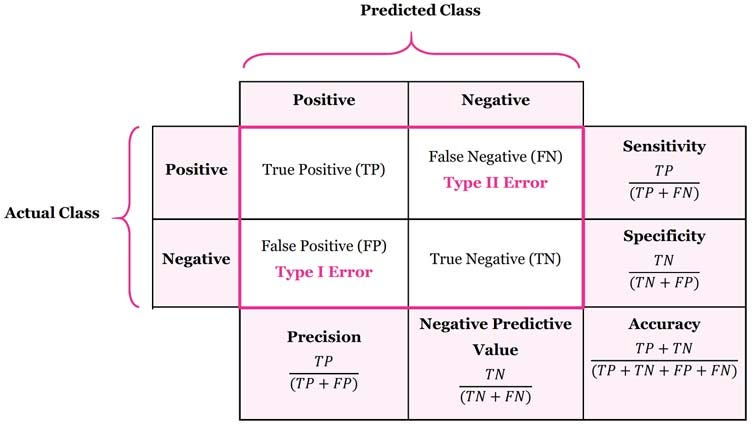

**Confusion Matric (Multi-Class)**

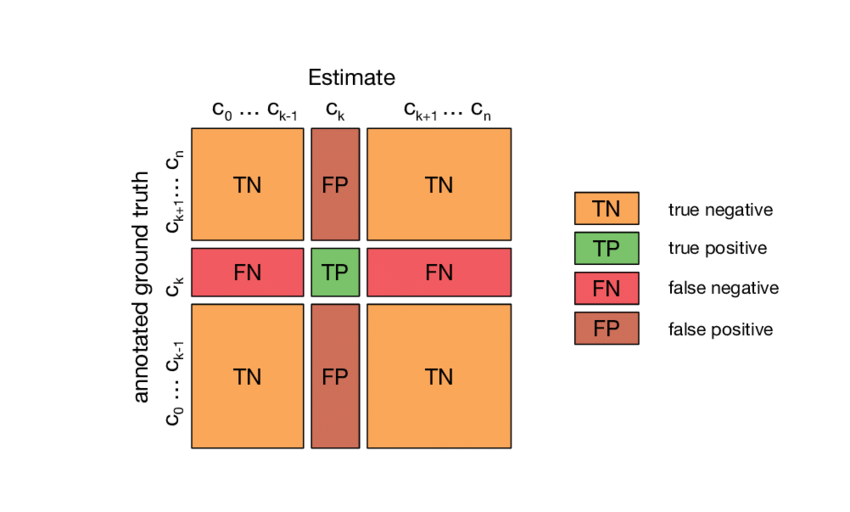

In [34]:
# creating the confusion matrix
all_knn_conf_matrix = confusion_matrix(y_test, all_knn_test_prediction)

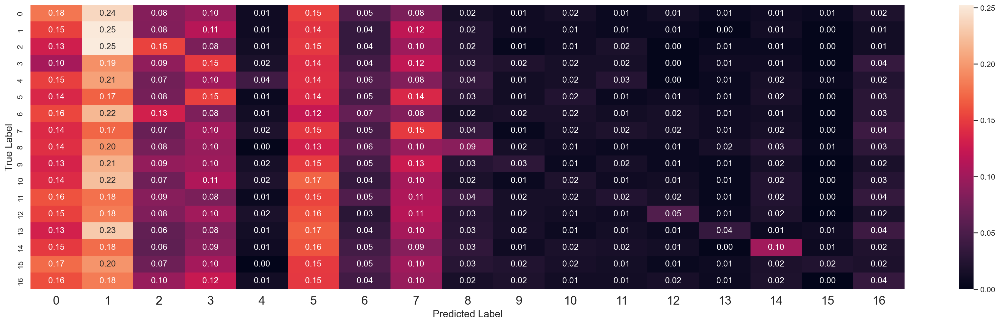

In [35]:
# normalising and viewing the confusion matrix
plt.clf() # clear previous diagrams
all_knn_conf_matrix_norm = all_knn_conf_matrix.astype('float') / all_knn_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_knn_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [36]:
# calculating metrics for the prediction
all_knn_metrics = metrics.classification_report(y_test, all_knn_test_prediction,target_names=categories)
print(all_knn_metrics)

                          precision    recall  f1-score   support

           comp.graphics       0.07      0.18      0.11       389
 comp.os.ms-windows.misc       0.08      0.25      0.12       394
comp.sys.ibm.pc.hardware       0.11      0.15      0.13       392
   comp.sys.mac.hardware       0.09      0.15      0.11       385
          comp.windows.x       0.19      0.04      0.07       395
               rec.autos       0.06      0.14      0.08       396
         rec.motorcycles       0.09      0.07      0.07       398
      rec.sport.baseball       0.09      0.15      0.11       397
        rec.sport.hockey       0.18      0.09      0.12       399
               sci.crypt       0.13      0.03      0.05       396
         sci.electronics       0.09      0.02      0.03       393
                 sci.med       0.10      0.02      0.04       396
               sci.space       0.27      0.05      0.09       394
      talk.politics.guns       0.22      0.04      0.06       364
   talk.p

### ✏️ Observe the results above and discuss the following:
- Is these good results? Why?

A:

不好，代表說只會分給前五個category，正常的話混肴矩陣的plot中對角線是亮的，所以這不是一個好的分類器

- What is the difference between Macro avg and Weighted avg?

A:

Weighted有考慮類別instance的多寡, Macro沒有


### 2.1.3 Hyperparameters Tuning

**Grid Search**

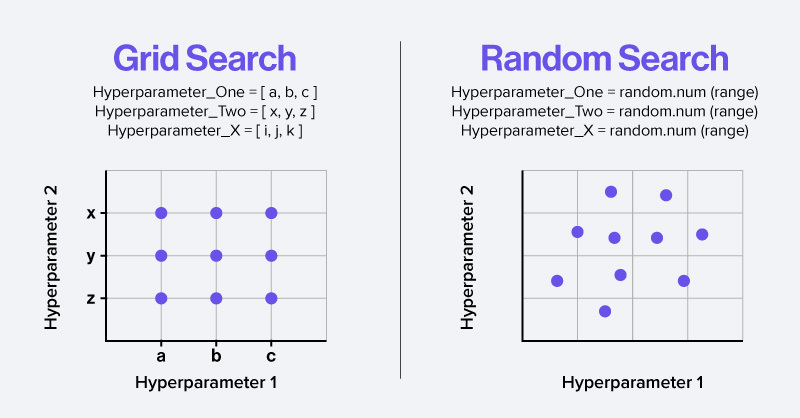

**Cross-Validation**
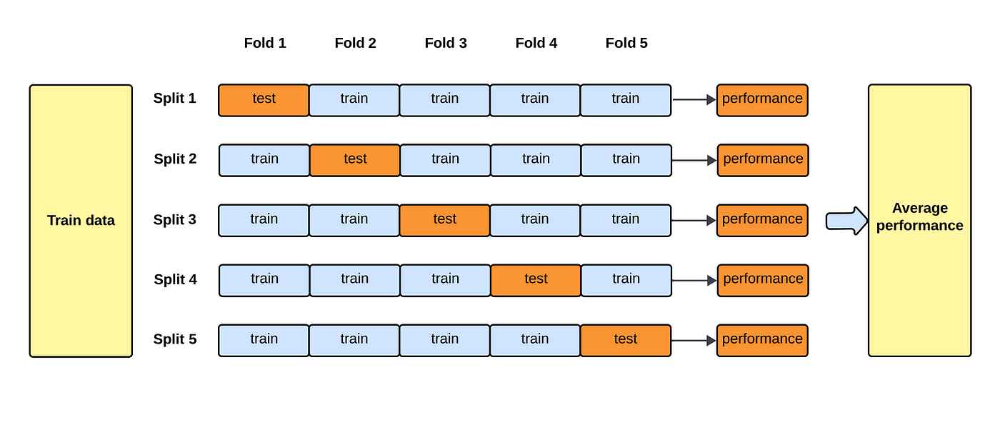

#### 2.1.3.1 Grid Search Cross Validation

In [37]:
# initializing grid search cross validation for hyperparameter tuning
neighbour_values=[i for i in range(1, 15)]
weight_values=['uniform', 'distance']
leaf_values = [30,40,50,60]

all_knn_parameters_dict = dict(n_neighbors=neighbour_values, weights=weight_values,leaf_size=leaf_values)
all_knn_grid = GridSearchCV(all_knn_clf, all_knn_parameters_dict, cv=5, scoring='accuracy', n_jobs=10)
all_knn_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(n_neighbors=4), n_jobs=10,
             param_grid={'leaf_size': [30, 40, 50, 60],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [38]:
# viewing the best parameters
print(all_knn_grid.best_params_)

{'leaf_size': 30, 'n_neighbors': 1, 'weights': 'uniform'}


#### 2.1.3.2 Retraining

In [39]:
# reinitializing and refitting the KNN Classifier
all_knn_ht_clf = KNeighborsClassifier(n_neighbors=1,weights='uniform',leaf_size=30)
all_knn_ht_clf.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

#### 2.1.3.3 Re-evaluation

In [40]:
# recalculating training accuracy
all_knn_ht_train_prediction = all_knn_ht_clf.predict(X_train)
all_knn_ht_train_accuracy = accuracy_score(y_train,all_knn_ht_train_prediction)
print("Training Accuracy with tuned Hyperparameters:",all_knn_ht_train_accuracy*100)
all_category_train_accuracy.append(all_knn_ht_train_accuracy)

# recalculating testing accuracy
all_knn_ht_test_prediction = all_knn_ht_clf.predict(X_test)
all_knn_ht_test_accuracy = accuracy_score(y_test, all_knn_ht_test_prediction)
print("Testing Accuracy with tuned Hyperparameters:",all_knn_ht_test_accuracy*100)
all_category_test_accuracy.append(all_knn_ht_test_accuracy)

Training Accuracy with tuned Hyperparameters: 97.139896373057
Testing Accuracy with tuned Hyperparameters: 12.01556420233463


In [41]:
# creating the confusion matrix
all_knn_ht_conf_matrix = confusion_matrix(y_test, all_knn_ht_test_prediction)

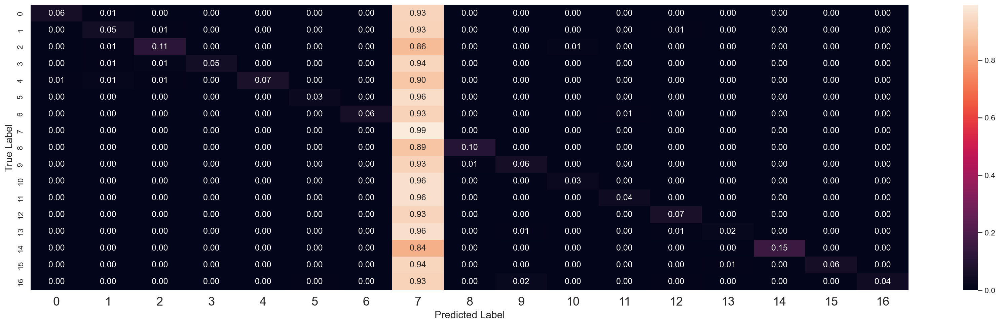

In [42]:
# renormalising and reviewing the confusion matrix
plt.clf() # clear previous diagrams
all_knn_ht_conf_matrix_norm = all_knn_ht_conf_matrix.astype('float') / all_knn_ht_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_knn_ht_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [43]:
# calculating metrics for the prediction
all_knn_ht_metrics = metrics.classification_report(y_test, all_knn_ht_test_prediction,target_names=categories)
print(all_knn_ht_metrics)

                          precision    recall  f1-score   support

           comp.graphics       0.85      0.06      0.11       389
 comp.os.ms-windows.misc       0.56      0.05      0.09       394
comp.sys.ibm.pc.hardware       0.82      0.11      0.20       392
   comp.sys.mac.hardware       0.90      0.05      0.09       385
          comp.windows.x       0.91      0.07      0.14       395
               rec.autos       0.85      0.03      0.05       396
         rec.motorcycles       0.77      0.06      0.11       398
      rec.sport.baseball       0.07      0.99      0.12       397
        rec.sport.hockey       0.95      0.10      0.18       399
               sci.crypt       0.71      0.06      0.10       396
         sci.electronics       0.58      0.03      0.05       393
                 sci.med       0.79      0.04      0.07       396
               sci.space       0.84      0.07      0.13       394
      talk.politics.guns       0.64      0.02      0.04       364
   talk.p

### ✏️ Observe the results above and discuss the following:
- Has the performance imporved? Try to interpret the results.

表現並沒有變好，都在自己的trainning data做可能會出問題，就算進行超參數調整，看有沒有變好，結果也是一樣



## 2.2 Support Vector Machine Classifier

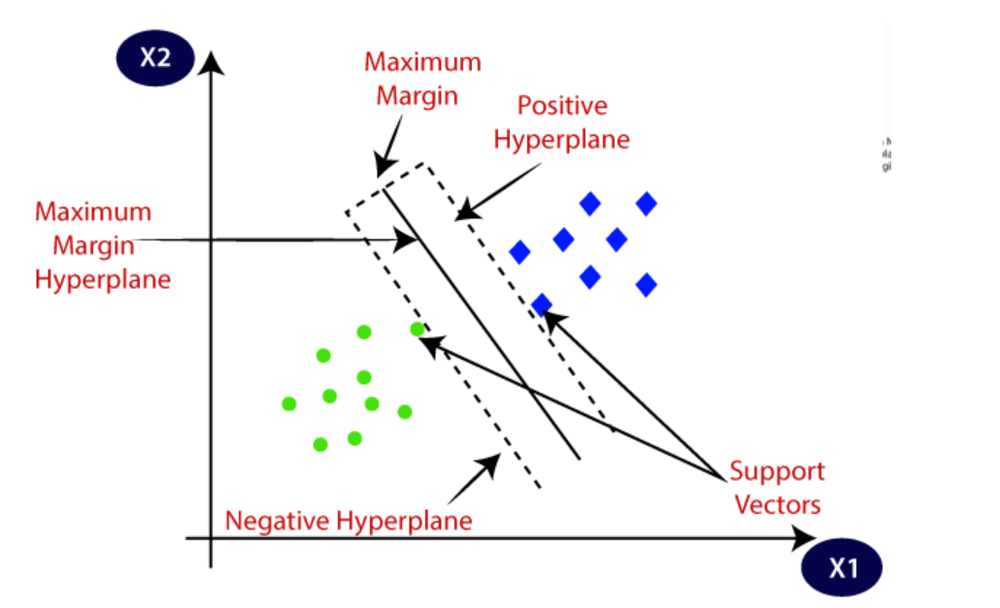
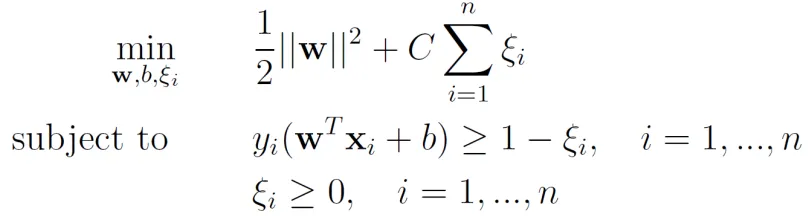

**The Parameters**
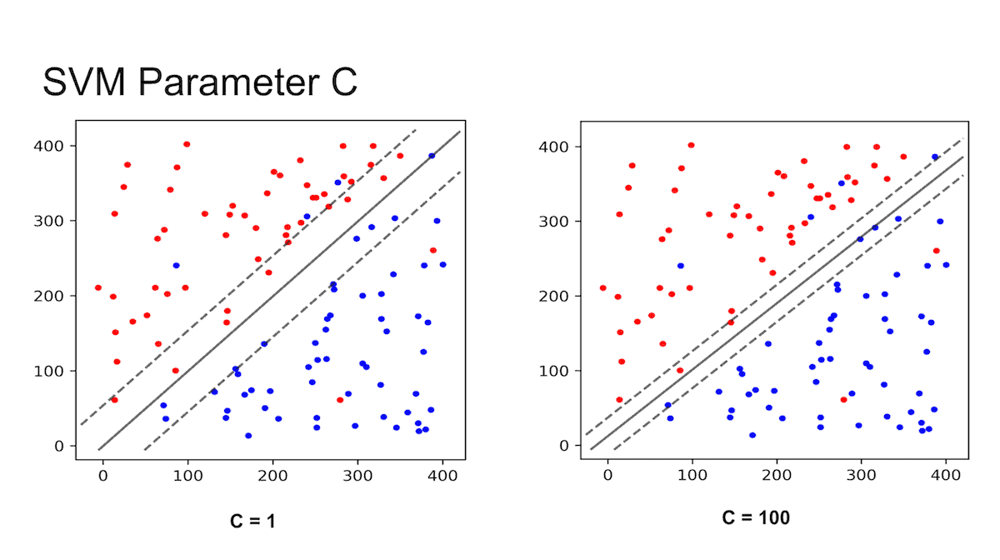

**Multi-Class Classification Setting**
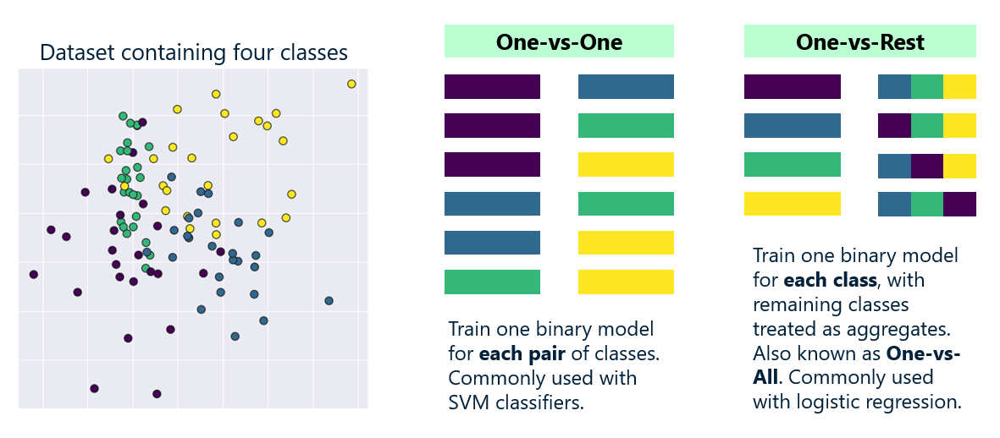

### 2.2.1 Training

In [44]:
# initializing and fitting the SVM classifier
all_svm_clf = LinearSVC(penalty='l2', loss='squared_hinge', dual=False, multi_class='ovr', max_iter=1000)
all_svm_clf.fit(X_train,y_train)

LinearSVC(dual=False)

### 2.2.2 Evaluation

In [45]:
# calculating training accuracy
all_svm_train_prediction = all_svm_clf.predict(X_train)
all_svm_train_accuracy = accuracy_score(y_train,all_svm_train_prediction)
print("Training Accuracy:",all_svm_train_accuracy*100)
all_category_train_accuracy.append(all_svm_train_accuracy)

# calculating testing accuracy
all_svm_test_prediction = all_svm_clf.predict(X_test)
all_svm_test_accuracy = accuracy_score(y_test, all_svm_test_prediction)
print("Testing Accuracy:",all_svm_test_accuracy*100)
all_category_test_accuracy.append(all_svm_test_accuracy)

Training Accuracy: 96.9119170984456
Testing Accuracy: 69.89883268482491


In [47]:
# creating the confusion matrix
all_svm_conf_matrix = confusion_matrix(y_test, all_svm_test_prediction)

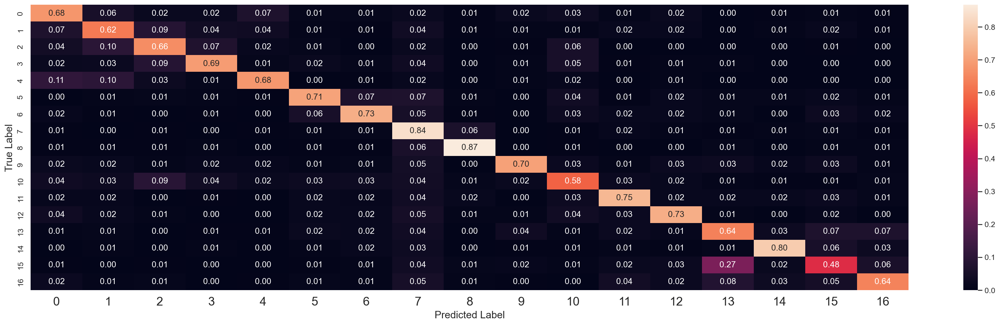

In [48]:
# normalizing and viewing the confusion matrix
plt.clf() # clear previous diagrams
all_svm_conf_matrix_norm = all_svm_conf_matrix.astype('float') / all_svm_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_svm_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [49]:
# calculating metrics for the prediction
all_svm_metrics = metrics.classification_report(y_test, all_svm_test_prediction,target_names=categories)
print(all_svm_metrics)

                          precision    recall  f1-score   support

           comp.graphics       0.62      0.68      0.65       389
 comp.os.ms-windows.misc       0.61      0.62      0.62       394
comp.sys.ibm.pc.hardware       0.64      0.66      0.65       392
   comp.sys.mac.hardware       0.74      0.69      0.71       385
          comp.windows.x       0.77      0.68      0.72       395
               rec.autos       0.75      0.71      0.73       396
         rec.motorcycles       0.75      0.73      0.74       398
      rec.sport.baseball       0.58      0.84      0.68       397
        rec.sport.hockey       0.86      0.87      0.86       399
               sci.crypt       0.83      0.70      0.76       396
         sci.electronics       0.62      0.58      0.60       393
                 sci.med       0.78      0.75      0.76       396
               sci.space       0.77      0.73      0.75       394
      talk.politics.guns       0.59      0.64      0.62       364
   talk.p

### ✏️ Observe the results above and discuss the following:
- Obviously, SVM is a very powerful classifier, so let's dive deeper into this model. The SVM classifier we use here utilizes a soft margin. What is a hard margin, and what is a soft margin in SVM?
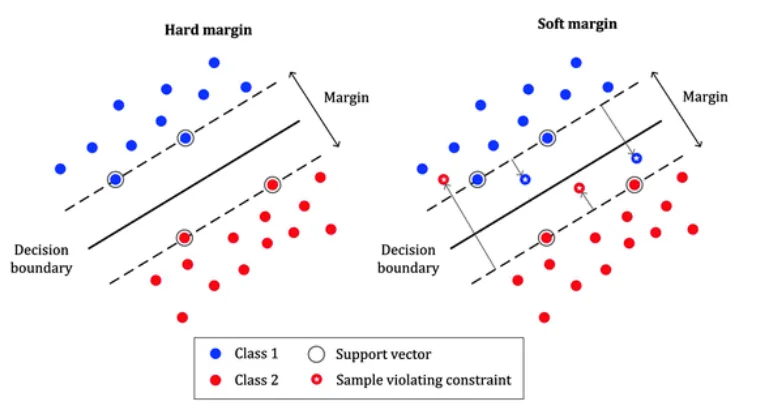
- What categories is SVM good at classifying? How about those SVM performs poorly on?

1.

A:
Hard Margin 是指SVM在分類時，嚴格要求數據完全可分離，且所有樣本必須在正確的一側邊界上，不允許任何分類錯誤。

Soft Margin 是在SVM中允許部分樣本違反分類邊界的情況，透過引入懲罰項 𝐶 來控制錯誤分類的容忍度。

2.
A:
Hard Margin只能用在完全線性可分的數據，而Soft Margin比較靈活，能夠處理現實中大多比較多噪聲的Data，是更常用的 SVM 模型。



### 2.2.3 Hyperparameters Tuning

##### **Grid Search Cross Validation**

In [50]:
# intializing grid search cross validation for hyperparameter tuning
penalty_values=['l1','l2']
tolerance_values = [0.1,0.001]
C_values=[2,5,10]
all_svm_parameters_dict = dict(penalty=penalty_values, C=C_values, tol=tolerance_values)
all_svm_grid = GridSearchCV(all_svm_clf, all_svm_parameters_dict, cv=5, scoring='accuracy', n_jobs=10)
all_svm_grid.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=LinearSVC(dual=False), n_jobs=10,
             param_grid={'C': [2, 5, 10], 'penalty': ['l1', 'l2'],
                         'tol': [0.1, 0.001]},
             scoring='accuracy')

In [51]:
# viewing the best parameters
print(all_svm_grid.best_params_)

{'C': 2, 'penalty': 'l2', 'tol': 0.1}


##### **Retraining**

In [52]:
# reinitializing and refitting the SVM classifier
all_svm_ht_clf = LinearSVC(penalty='l2', loss='squared_hinge', dual=False, multi_class='ovr', max_iter=1000, C=2, tol=0.1)
all_svm_ht_clf.fit(X_train,y_train)

LinearSVC(C=2, dual=False, tol=0.1)

##### **Revaluation**

In [53]:
# recalculating training accuracy
all_svm_ht_train_prediction = all_svm_ht_clf.predict(X_train)
all_svm_ht_train_accuracy = accuracy_score(y_train,all_svm_ht_train_prediction)
print("Training Accuracy with tuned hyperparameters:",all_svm_ht_train_accuracy*100)
all_category_train_accuracy.append(all_svm_ht_train_accuracy)

# recalculating testing accuracy
all_svm_ht_test_prediction = all_svm_ht_clf.predict(X_test)
all_svm_ht_test_accuracy = accuracy_score(y_test, all_svm_ht_test_prediction)
print("Testing Accuracy with tuned hyperparameters:",all_svm_ht_test_accuracy*100)
all_category_test_accuracy.append(all_svm_ht_test_accuracy)

Training Accuracy with tuned hyperparameters: 96.05181347150258
Testing Accuracy with tuned hyperparameters: 70.10116731517509


In [54]:
# creating the confusion matrix
all_svm_ht_conf_matrix = confusion_matrix(y_test, all_svm_ht_test_prediction)

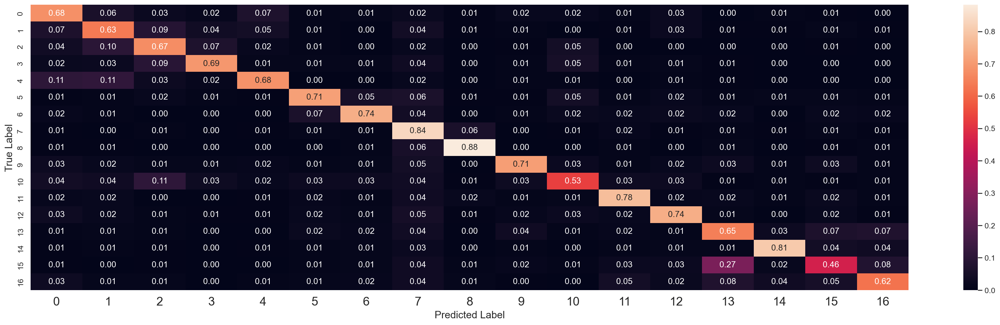

In [55]:
# renormalizing and reviewing the confusion matrix
plt.clf() # clear previous diagrams
all_svm_ht_conf_matrix_norm = all_svm_ht_conf_matrix.astype('float') / all_svm_ht_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_svm_ht_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [56]:
# calculating metrics for the prediction
all_svm_ht_metrics = metrics.classification_report(y_test, all_svm_ht_test_prediction, target_names=categories)
print(all_svm_ht_metrics)

                          precision    recall  f1-score   support

           comp.graphics       0.61      0.68      0.64       389
 comp.os.ms-windows.misc       0.59      0.63      0.61       394
comp.sys.ibm.pc.hardware       0.62      0.67      0.64       392
   comp.sys.mac.hardware       0.76      0.69      0.73       385
          comp.windows.x       0.76      0.68      0.72       395
               rec.autos       0.75      0.71      0.73       396
         rec.motorcycles       0.78      0.74      0.76       398
      rec.sport.baseball       0.59      0.84      0.69       397
        rec.sport.hockey       0.87      0.88      0.88       399
               sci.crypt       0.80      0.71      0.75       396
         sci.electronics       0.65      0.53      0.58       393
                 sci.med       0.79      0.78      0.78       396
               sci.space       0.76      0.74      0.75       394
      talk.politics.guns       0.59      0.65      0.62       364
   talk.p

## 2.3 Multinomial Naive Bayes Classifier

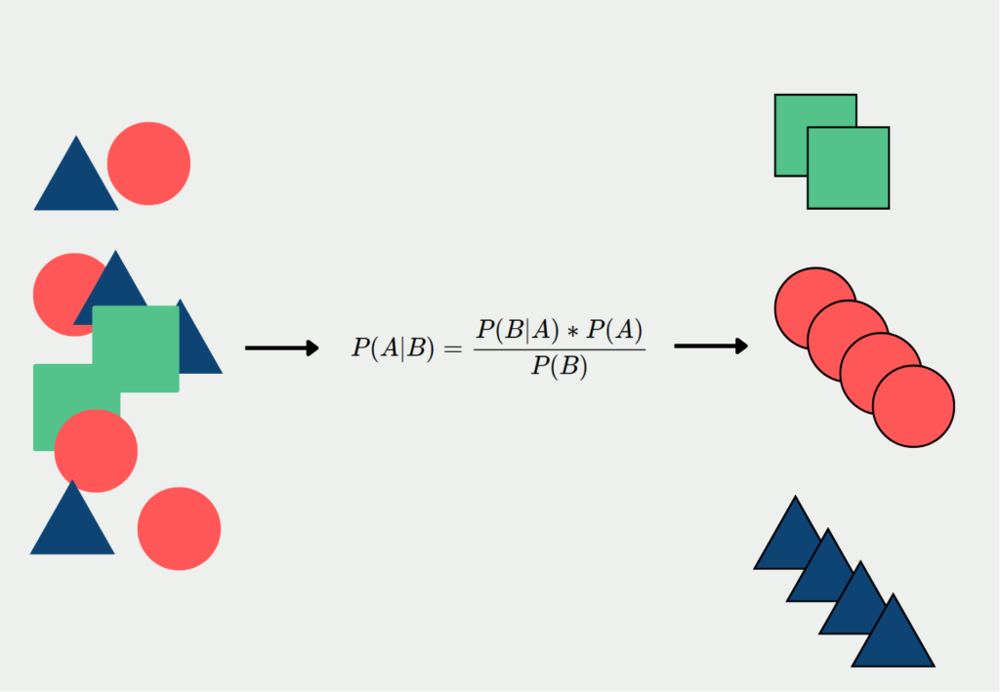
**The classification problem: find $p(class|doc)$**
$$p(class|doc)=\frac{p(doc|class)\cdot p(class)}{p(doc)}$$

**Estimation of $p(class|doc)$**

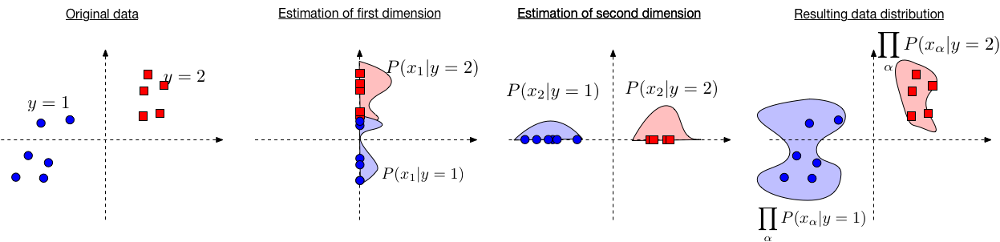


📖 [A very good explanation to Bayes Classifers](https://www.cs.cornell.edu/courses/cs4780/2022fa/lectures/lecturenote05.html)

### 2.3.1 Training

In [57]:
# initializing and fitting the Multinomial Naive Bayes Classifier
all_mnb_clf = MultinomialNB(alpha=0.1)
all_mnb_clf.fit(X_train,y_train)

MultinomialNB(alpha=0.1)

### ✏️ Observe the results above and discuss the following:
- What does the parameter alpha control?

A:

Multinomial Naive Bayes分類器中，alpha控制Additive Smoothing，也叫做Laplace Smoothing或Lidstone Smoothing，用來防止機率為0的問題，在Trainset中，某些特徵可能在特定類別下未出現，導致其條件機率估計為零，alpha 的最佳值取決於具體的數據集和應用的Tasks，進行調參來達到最佳效果。

### 2.3.2 Evaluation

In [58]:
# calculating training accuracy
all_mnb_train_prediction = all_mnb_clf.predict(X_train)
all_mnb_train_accuracy = accuracy_score(y_train, all_mnb_train_prediction)
print("Training Accuracy:",all_mnb_train_accuracy*100)
all_category_train_accuracy.append(all_mnb_train_accuracy)

# calculating the testing accuracy 
all_mnb_test_prediction = all_mnb_clf.predict(X_test)
all_mnb_test_accuracy= accuracy_score(y_test, all_mnb_test_prediction)
print("Testing Accuracy:",all_mnb_test_accuracy*100)
all_category_test_accuracy.append(all_mnb_test_accuracy)

Training Accuracy: 93.17098445595855
Testing Accuracy: 71.56420233463035


In [59]:
# creating the confusion matrix
all_mnb_conf_matrix = confusion_matrix(y_test, all_mnb_test_prediction)

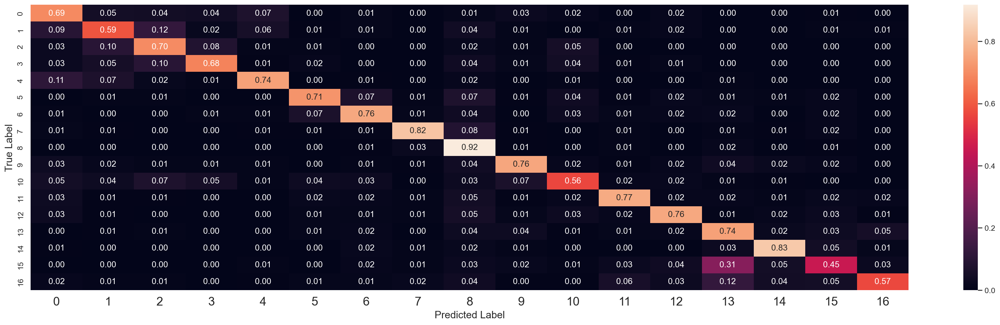

In [60]:
# normalising and viewing the confusion matrix
plt.clf() # clear previous diagrams
all_mnb_conf_matrix_norm = all_mnb_conf_matrix.astype('float') / all_mnb_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_mnb_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [61]:
# calculating metrics for the prediction
all_mnb_metrics = metrics.classification_report(y_test, all_mnb_test_prediction,target_names=categories)
print(all_mnb_metrics)

                          precision    recall  f1-score   support

           comp.graphics       0.61      0.69      0.65       389
 comp.os.ms-windows.misc       0.62      0.59      0.60       394
comp.sys.ibm.pc.hardware       0.63      0.70      0.66       392
   comp.sys.mac.hardware       0.74      0.68      0.71       385
          comp.windows.x       0.79      0.74      0.77       395
               rec.autos       0.79      0.71      0.75       396
         rec.motorcycles       0.76      0.76      0.76       398
      rec.sport.baseball       0.89      0.82      0.85       397
        rec.sport.hockey       0.61      0.92      0.73       399
               sci.crypt       0.78      0.76      0.77       396
         sci.electronics       0.67      0.56      0.61       393
                 sci.med       0.82      0.77      0.79       396
               sci.space       0.78      0.76      0.77       394
      talk.politics.guns       0.58      0.74      0.65       364
   talk.p

### 2.2.3 Hyperparameters Tuning

##### **Grid Search Cross Validation**

In [62]:
# initializing Grid Search Cross Validation for hyperparameter tuning
alpha_range = [0.0001, 0.001, 0.01, 0.2, 0.5, 0.7, 1, 2, 5, 8, 9, 10]
fit_vals=[True,False]
all_mnb_parameters_dict = dict(alpha=alpha_range,fit_prior=fit_vals)
all_mnb_grid = GridSearchCV(all_mnb_clf, all_mnb_parameters_dict, cv=5, scoring='accuracy', n_jobs=10)
all_mnb_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=MultinomialNB(alpha=0.1), n_jobs=10,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.2, 0.5, 0.7, 1, 2, 5,
                                   8, 9, 10],
                         'fit_prior': [True, False]},
             scoring='accuracy')

In [63]:
# viewing the best parameters
all_mnb_grid.best_params_

{'alpha': 0.2, 'fit_prior': False}

##### **Retraining**

In [64]:
# reinitializing and refitting the Multinomial Naive Bayes Classifier
all_mnb_ht_clf = MultinomialNB(alpha=0.2,fit_prior=False)
all_mnb_ht_clf.fit(X_train,y_train)

MultinomialNB(alpha=0.2, fit_prior=False)

##### **Revaluation**

In [65]:
# recalculating training accuracy
all_mnb_ht_train_prediction = all_mnb_ht_clf.predict(X_train)
all_mnb_ht_train_accuracy = accuracy_score(y_train, all_mnb_ht_train_prediction)
print("Training Accuracy with tuned hyperparameters:",all_mnb_ht_train_accuracy*100)
all_category_train_accuracy.append(all_mnb_ht_train_accuracy)

# recalculating testing accuracy
all_mnb_ht_test_prediction = all_mnb_ht_clf.predict(X_test)
all_mnb_ht_test_accuracy= accuracy_score(y_test, all_mnb_ht_test_prediction)
print("Testing Accuracy with tuned hyperparameters:",all_mnb_ht_test_accuracy*100)
all_category_test_accuracy.append(all_mnb_ht_test_accuracy)

Training Accuracy with tuned hyperparameters: 92.42487046632124
Testing Accuracy with tuned hyperparameters: 71.73540856031128


In [66]:
# creating the confusion matrix
all_mnb_ht_conf_matrix = confusion_matrix(y_test, all_mnb_ht_test_prediction)

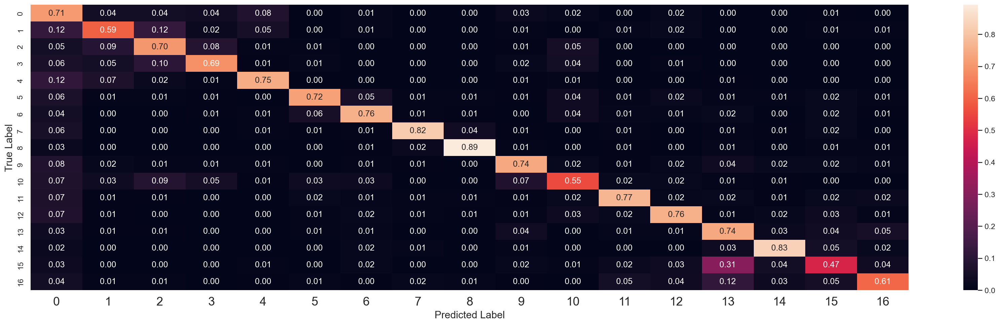

In [67]:
# renormalising and viewing the confusion matrix
all_mnb_ht_conf_matrix_norm = all_mnb_ht_conf_matrix.astype('float') / all_mnb_ht_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_mnb_ht_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');

In [68]:
# recalculating metrics for the prediction
all_mnb_ht_metrics = metrics.classification_report(y_test, all_mnb_ht_test_prediction,target_names=categories)
print(all_mnb_ht_metrics)

                          precision    recall  f1-score   support

           comp.graphics       0.43      0.71      0.53       389
 comp.os.ms-windows.misc       0.64      0.59      0.62       394
comp.sys.ibm.pc.hardware       0.62      0.70      0.66       392
   comp.sys.mac.hardware       0.74      0.69      0.72       385
          comp.windows.x       0.79      0.75      0.77       395
               rec.autos       0.81      0.72      0.77       396
         rec.motorcycles       0.79      0.76      0.77       398
      rec.sport.baseball       0.90      0.82      0.86       397
        rec.sport.hockey       0.91      0.89      0.90       399
               sci.crypt       0.77      0.74      0.75       396
         sci.electronics       0.67      0.55      0.61       393
                 sci.med       0.83      0.77      0.80       396
               sci.space       0.79      0.76      0.77       394
      talk.politics.guns       0.59      0.74      0.65       364
   talk.p

## 2.4 Logistic Regression

**Logistic regression is linear regression and a Sigmoid function:**
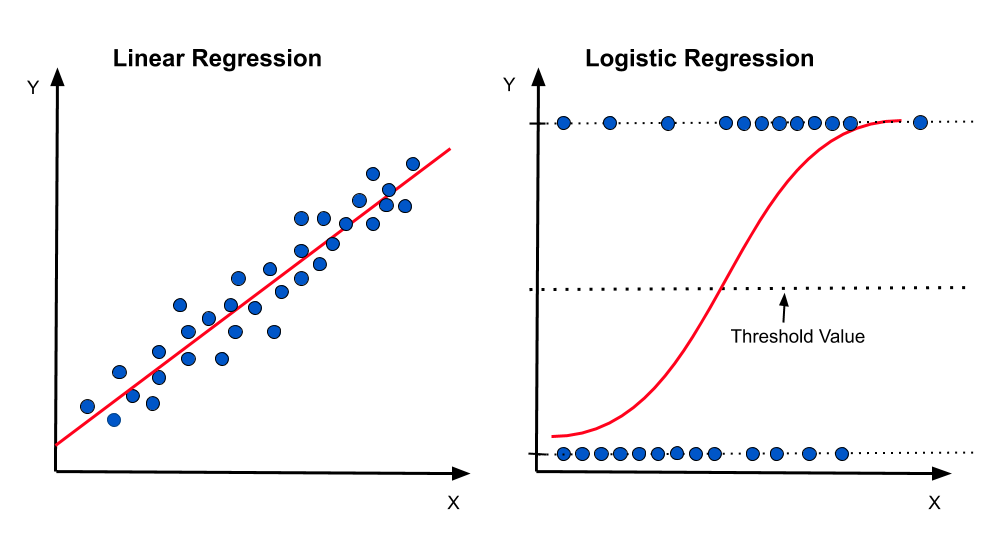

**The Sigmoid Function**

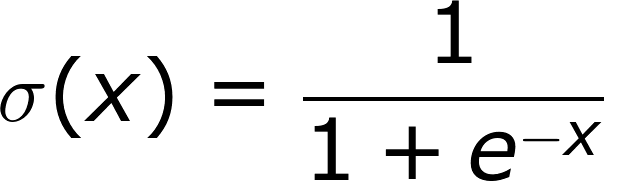

**The Logistic Regression can therefore be represented as:**

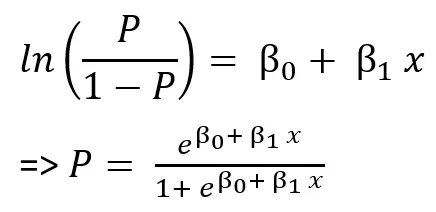

### 2.4.1 Training

In [69]:
# initializing and fitting the Logistic Regression Classifier
all_lr_clf = LogisticRegression(multi_class='multinomial', solver='lbfgs')
all_lr_clf.fit(X_train, y_train)

LogisticRegression(multi_class='multinomial')

### 2.4.2 Evaluation

In [70]:
# calculating training accuracy
all_lr_train_prediction = all_lr_clf.predict(X_train)
all_lr_train_accuracy = accuracy_score(y_train, all_lr_train_prediction)
print("Training Accuracy:",all_lr_train_accuracy*100)
all_category_train_accuracy.append(all_lr_train_accuracy)

# calculating the testing accuracy 
all_lr_test_prediction = all_lr_clf.predict(X_test)
all_lr_test_accuracy= accuracy_score(y_test, all_lr_test_prediction)
print("Testing Accuracy:",all_lr_test_accuracy*100)
all_category_test_accuracy.append(all_lr_test_accuracy)

Training Accuracy: 91.60621761658031
Testing Accuracy: 70.568093385214


In [71]:
# creating the confusion matrix
all_lr_conf_matrix = confusion_matrix(y_test, all_lr_test_prediction)

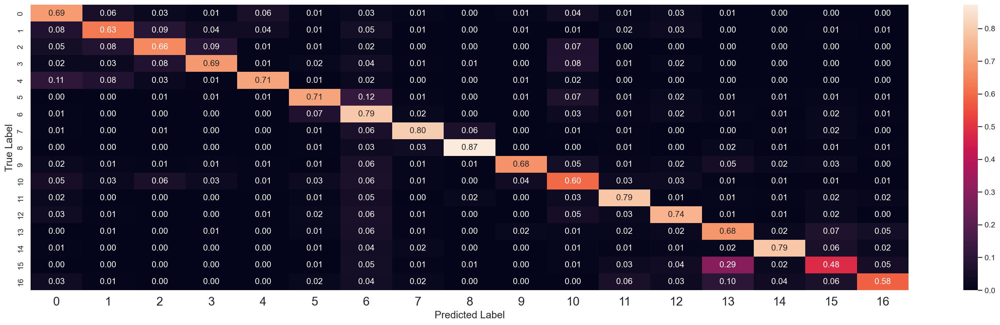

In [72]:
# normalising and viewing the confusion matrix
plt.clf() # clear previous diagrams
all_lr_conf_matrix_norm = all_lr_conf_matrix.astype('float') / all_lr_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_lr_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

### ✏️ Observe the results above and discuss the following:
- Logistic regression is a very simple classifier. However, it already reaches decent performance. Let's use grid search to find a better parameter setting and see if we can improve the performance even further!

A:

LogisticRegression模型中有多個超參數可調整：

penalty：正則化方式，可選擇 'l1'、'l2'、'elasticnet' 或 'none'，不同的懲罰項有助於防止過擬合

C：正則化強度的倒數，必須為正數。較小的值表示更強的正則化

solver：優化算法，如 'newton-cg'、'lbfgs'、'liblinear'、'sag'、'saga'。不同的求解器適用於不同的數據規模和正則化方式

max_iter：算法收斂的最大迭代次數

class_weight：類別權重，用於處理類別不平衡問題，可設置為 'balanced' 

fit_intercept：是否計算截距項

multi_class：多類別設定，'auto'、'ovr'或 'multinomial'

## 2.5 Logistic Regression (One-vs-all)

### 2.5.1 Training

In [92]:
# initializing and fitting the Logistic Regression Classifier
all_lrovr_clf = LogisticRegression(multi_class='ovr')
all_lrovr_clf.fit(X_train, y_train)

LogisticRegression(multi_class='ovr')

### 2.5.2 Evaluation

In [99]:
# calculating training accuracy
all_lrovr_train_prediction = all_lrovr_clf.predict(X_train)
all_lrovr_train_accuracy = accuracy_score(y_train, all_lrovr_train_prediction)
print("Training Accuracy:",all_lrovr_train_accuracy*100)
all_category_train_accuracy.append(all_lrovr_train_accuracy)

# calculating the testing accuracy 
all_lrovr_test_prediction = all_lrovr_clf.predict(X_test)
all_lrovr_test_accuracy= accuracy_score(y_test, all_lrovr_test_prediction)
print("Testing Accuracy:",all_lrovr_test_accuracy*100)
all_category_test_accuracy.append(all_lrovr_test_accuracy)

Training Accuracy: 90.40414507772022
Testing Accuracy: 70.70817120622567


In [96]:
# creating the confusion matrix
all_lrovr_conf_matrix = confusion_matrix(y_test, all_lrovr_test_prediction)

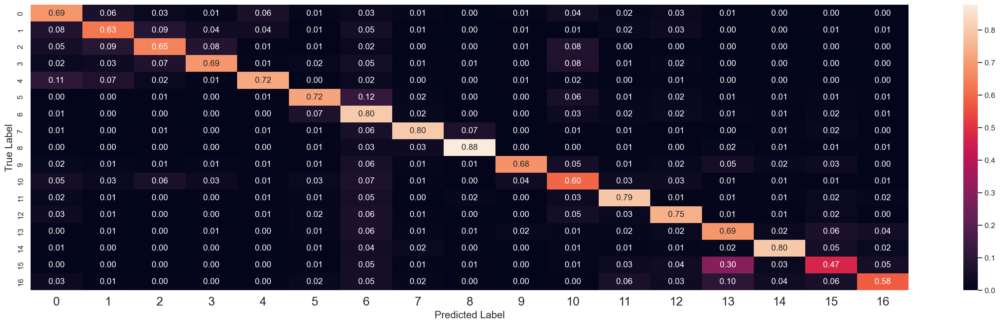

In [97]:
# normalising and viewing the confusion matrix
plt.clf() # clear previous diagrams
all_lrovr_conf_matrix_norm = all_lrovr_conf_matrix.astype('float') / all_lrovr_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(all_lrovr_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

### ✏️ Observe the results above and discuss the following:
- Compare the performance between the two types of Logistic Regression classifier. Which one performs better in this task? Can you tell why?

A:

一對多的表現比較好, 在此任務中，ovr邏輯迴歸比多項式邏輯迴歸好一點，可能是因為數據中各類別之間的相關性較低，使得OvR方法更有效地區分類別，OvR 的簡單性可能有更好的泛化能力，減少過擬合的風險。


## 2.6 Performance Comparision

### 2.6.1 Accuracy

In [104]:
# comparing training and testing accuracies
all_model_acc_compare = pd.DataFrame({'Algorithm' : classification_models, 'Training_Accuracy' : all_category_train_accuracy, 'Testing_Accuracy' : all_category_test_accuracy})
all_model_acc_compare.sort_values(by='Testing_Accuracy', ascending=False)

,Algorithm,Training_Accuracy,Testing_Accuracy
5,Multinomial Naive Bayes Hypertuned,0.924249,0.717354
4,Multinomial Naive Bayes,0.931710,0.715642
7,Logistic Regression One-vs-all,0.904041,0.707082
6,Logistic Regression Multiclass,0.916062,0.705681
3,Support Vector Machine Hypertuned,0.960518,0.701012
2,Support Vector Machine,0.969119,0.698988
1,K Nearest Neighbor Hypertuned,0.971399,0.120156
0,K Nearest Neighbor,0.416166,0.092607


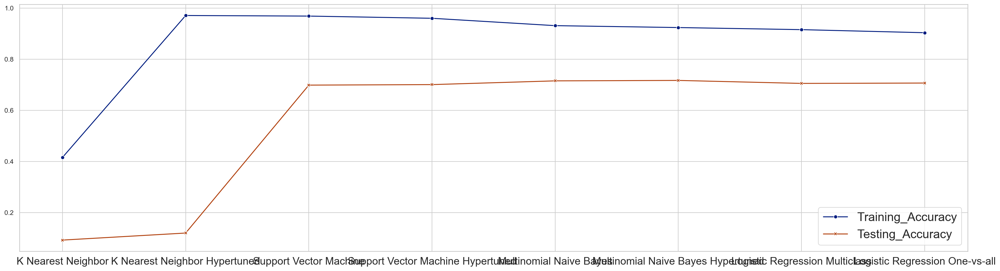

In [105]:
# visualizing the training and testing accuracies
plt.clf() # clear previous diagrams
ax = sns.lineplot(data=[all_model_acc_compare['Training_Accuracy'], all_model_acc_compare['Testing_Accuracy']], dashes=False, markers=True)
ax.set_xticks(range(len(all_model_acc_compare['Algorithm'])))
ax.set_xticklabels(all_model_acc_compare['Algorithm'])
plt.show()

### ✏️ Observe the results above and discuss the following:
- Why do you think Multinomial Naive Bayes performs well on the test set compared to other algorithms? What characteristics of this algorithm make it suitable for this dataset?

A:
Multinomial Naive Bayes 適合處理像文本數據這樣的高維特徵，它假設特徵是獨立的，且為多項式分佈，本身對噪聲的容忍度也較高，所以在測試集上表現得穩定，而且經過超參數調優，可以解決0機率問題，進一步提高測試集的準確率，這使得它在測試數據上表現超過了其他算法。

- Observe the large gap between training and testing accuracy for KNN (Hyper-tuned). What might this indicate about the model's performance? Why does hyperparameter tuning improve the testing accuracy for some algorithms (e.g., Naive Bayes) but not for others (e.g., KNN)?

A:
KNN Hyper-tuned 的訓練準確率非常高，但測試準確率卻非常低，這說明它出現了過擬合問題，應該是因為選擇的 k 值過小，模型過於依賴訓練數據中的細節，導致在測試數據上無法泛化，KNN 的性能對數據分佈和鄰近點的選擇非常敏感，當數據訓練數據分佈不一致時，會導致測試表現不佳。而超參數調優對某些算法有效但對 KNN 無效，這跟算法有關，Naive Bayes 通過調整 alpha 改善了模型對稀疏數據的處理能力，而 KNN 是一個非參數方法，即使調整 k 也無法解決數據分佈本身的問題。

- Based on the results, which algorithm would you choose for this task, and why? Consider both training and testing accuracy in your decision.

A:
我會選擇 Multinomial Naive Bayes（Hyper-tuned），它在測試集上的準確率最高，且訓練準確率和測試準確率之間的差距不大，這表明模型沒有Overfitting 和 Underfitting，Naive Bayes 的訓練速度非常快，非常適合處理高維特徵，相比於 KNN 或 SVM，Naive Bayes 在類別較多的情況下也更具穩定性。

- How could you conduct error analysis to understand why certain models, such as KNN, struggle on the test set?

A:
可以看混淆矩陣哪些類別經常被錯分，幫助我們了解類別之間的關係，如果某些類別始終被錯分，可能是這些類別的特徵分佈非常相似。檢查測試數據與訓練數據的分佈是否一致，KNN 無法適應這種分佈差異，確認數據中是否存在噪聲或類別不平衡，這會影響 KNN 的性能。查看 KNN 預測錯誤的樣本，它們的鄰近點是否屬於其他類別，還有檢查特徵是否存在無關的部分。
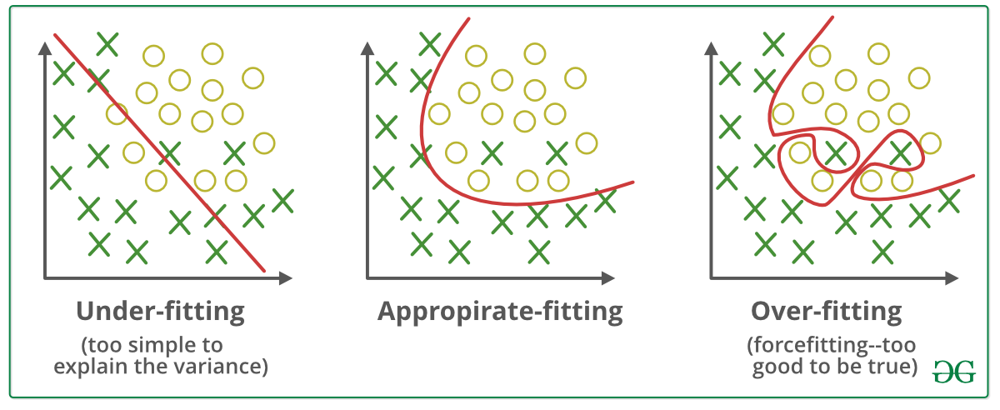



### 2.6.2 Holistic Comparision

In [106]:
# calculating all the performance metrics
all_precision_score.extend([metrics.precision_score(y_test, all_knn_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_knn_ht_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_svm_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_svm_ht_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_mnb_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_mnb_ht_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_lr_test_prediction,average="weighted")*100,
                            metrics.precision_score(y_test, all_lrovr_test_prediction,average="weighted")*100])

all_recall_score.extend([metrics.recall_score(y_test, all_knn_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_knn_ht_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_svm_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_svm_ht_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_mnb_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_mnb_ht_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_lr_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, all_lrovr_test_prediction,average="weighted")*100])

all_f1_score.extend([metrics.f1_score(y_test, all_knn_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_knn_ht_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_svm_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_svm_ht_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_mnb_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_mnb_ht_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_lr_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, all_lrovr_test_prediction,average="weighted")*100])

In [108]:
# displaying all the performance metrics
all_comp_metric = pd.DataFrame({'Model' : classification_models,
                       'Precision' : all_precision_score,
                       'Recall' : all_recall_score,
                       'F1' : all_f1_score,
                       'Test_Accuracy' : all_category_test_accuracy},
                       index=["", "", "","","","","","17 Indivudial Groups"])

all_comp_metric.sort_values(by='Test_Accuracy', ascending=False, inplace=True)
all_comp_metric

,Model,Precision,Recall,F1,Test_Accuracy
,Multinomial Naive Bayes Hypertuned,73.244124,71.735409,72.097104,0.717354
,Multinomial Naive Bayes,72.279256,71.564202,71.485143,0.715642
17 Indivudial Groups,Logistic Regression One-vs-all,71.947845,70.708171,70.919883,0.707082
,Logistic Regression Multiclass,71.864833,70.568093,70.819400,0.705681
,Support Vector Machine Hypertuned,70.666329,70.101167,70.109379,0.701012
,Support Vector Machine,70.532541,69.898833,69.974306,0.698988
,K Nearest Neighbor Hypertuned,75.246541,12.015564,11.525749,0.120156
,K Nearest Neighbor,13.658526,9.260700,8.451347,0.092607


### ✏️ Observe the results above and discuss the following:
- What additional information you obtain from this table, compared to the previous one?

從F1表中能更清楚看到不同模型在各項指標上的差異，Multinomial Naive Bayes Hyper-tuned 是最佳選擇，因為它的 F1 分數最高，並且 Precision 和 Recall 比較均衡。Logistic Regression 雖然稍遜一籌，但也是穩定的選擇。F1 分數的高低反映了模型對精確率與召回率的綜合平衡能力，過於偏向某一指標的模型像是KNN）的泛化能力最差。如果想要高 Recall，可以考慮 Logistic Regression，如果是整體穩定性和平衡性，Multinomial Naive Bayes 是最佳選擇。

# 3. Classification, but with Only 4 Groups

**Grouping the topics with similar source. For instance**:
1. Topics related to hockey, baseball, motorcycle, and autos are grouped under the term 'rec', which means recreation.
2. Topics related to graphics, ms-windows.misc, ibm.pc.hardware, mac.hardware, and windows.x are grouped under the term 'comp', which means computer.
3. Topics related to crypt, electronics, med, and space are grouped under the term 'sci', which means science.
4. Topics related to guns, mideast, politics.misc, and religion.misc are grouped under the term 'talk', which means talk.

✏️ Before we start the experiment, let's make a guess: will the classification accuracy improve or decrease?

分組後分類準確率可能提高，因為減少類別數量，降低模型分類難度，且組內主題的相似性高，有助於模型學習共享特徵。


## 3.1 Data Preparation

### 3.1.1 Mapping from 17 Classes to 4 Classes

In [109]:
# newly grouped categories
grouped_categories = [
                  'computer',
                  'recreation',
                  'science',
                  'talk'
                  ]

In [110]:
# setting column names for both training and testing targets
y_train.columns = ['label']
y_test.columns = ['label']

In [111]:
# transformation map for grouping the 17 indiviudal groups to 4 clubbed groups
transformation_map = {
                      0 : 0,
                      1 : 0,
                      2 : 0,
                      3 : 0,
                      4 : 0,
                      5 : 1,
                      6 : 1,
                      7 : 1,
                      8 : 1,
                      9 : 2,
                      10 : 2,
                      11 : 2,
                      12 : 2,
                      13 : 3,
                      14 : 3,
                      15 : 3,
                      16 : 3,
                    }

In [112]:
# creating a new column that has the mapped data
y_train['new_label'] = y_train['label'].map(transformation_map)
y_test['new_label'] = y_test['label'].map(transformation_map)

In [113]:
# dropping the column with original label
y_train = y_train.drop(labels='label', axis=1)
y_test = y_test.drop(labels='label', axis=1)

In [114]:
def count_per_new_categories(df):
  """
  Function to return the number of documents per class for new categories
  """
  dictionary={}
  cate=total_training_data.target_names
  target, targetNames, new_cat, countlist=[], [], [], []
  compCount, sciCount, talkCount, recCount=0 ,0, 0, 0
  for i in df['target']:
    new_cat.append(cate[i])
  df['category']=new_cat
  for i in df['category']:
    if('comp' in i):
      target.append(0)
      compCount+=1
      targetNames.append('computer')
    elif('rec' in i):
      target.append(1)
      targetNames.append('recreational')
      recCount+=1
    elif('sci' in i):
      target.append(2)
      targetNames.append('science')
      sciCount+=1
    elif('talk' in i):
      target.append(3)
      targetNames.append('talk')
      talkCount+=1
    else:
      target.append(4)
      targetNames.append('else')
  countlist.extend([compCount,recCount,sciCount,talkCount])
  df['new_target']=target
  df['new_target_names']=targetNames
  df = df[df.new_target != 4]
  for i in range(4):
    dictionary[grouped_categories[i]]=countlist[i]
  return dictionary

In [115]:
# intitalizng the training dataframe that has both feature and the target variable
df_entire = pd.DataFrame(total_training_data['data'], columns=["post"])
df_entire['target']=total_training_data['target']

In [116]:
# viewing the count of documents per new category
new_count_per_category = count_per_new_categories(df_entire)
new_count_per_category

{'computer': 2936, 'recreation': 2389, 'science': 2373, 'talk': 1952}

<Figure size 3750x1050 with 0 Axes>

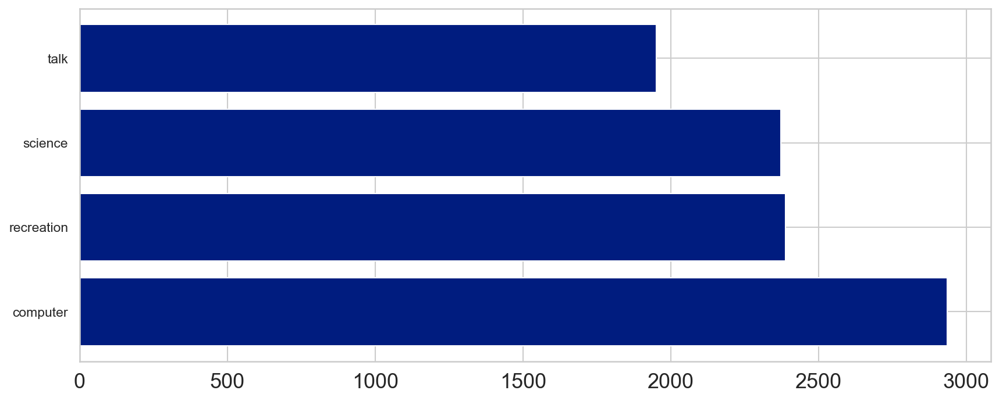

In [117]:
# plotting the count of documents per new category
plt.clf()
plt.figure(figsize=(12, 5))
category = list(new_count_per_category.keys())
count = list(new_count_per_category.values())
plt.barh(range(len(new_count_per_category)), count, tick_label=grouped_categories)
plt.show()

### ✏️ Observe the results above and discuss the following:
- Compare this new class distribution with the 17-category distribution we saw previously. Are the majority classes even more dominant? How might this affect classification performance?

A:

新的分組使主要類別（computer）的優勢更加突出，這種不平衡可能會提升多數類別的準確率，但影響小數類別（如 talk）的分類效果，這樣的分佈，可以考慮引入類別平衡策略來提高整體分類性能，尤其是對小類別的預測能力。

### 3.1.2 Classification Performance

In [118]:
# initializing lists to track the training and testing accuracies
sub_category_train_accuracy = []
sub_category_test_accuracy = []

In [119]:
# initializing lists to track performance metrics
sub_precision_score = []
sub_recall_score = []
sub_f1_score = []

## 3.2 K-Nearest Neighbour Classifier


### 3.2.1 Training

In [120]:
# initializing and fitting the KNN Classifier
sub_knn_clf = KNeighborsClassifier(n_neighbors=4)
sub_knn_clf.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=4)

### 3.2.2 Evaluation

In [121]:
# calculating training accuracy
sub_knn_train_prediction = sub_knn_clf.predict(X_train)
sub_knn_train_accuracy = accuracy_score(y_train,sub_knn_train_prediction)
print("Training Accuracy:", sub_knn_train_accuracy*100)
sub_category_train_accuracy.append(sub_knn_train_accuracy)

# calculating testing accuracy
sub_knn_test_prediction = sub_knn_clf.predict(X_test)
sub_knn_test_accuracy = accuracy_score(y_test, sub_knn_test_prediction)
print("Testing Accuracy:", sub_knn_test_accuracy*100)
sub_category_test_accuracy.append(sub_knn_test_accuracy)

Training Accuracy: 59.49222797927462
Testing Accuracy: 28.498054474708173


In [122]:
# creating the confusion matrix
sub_knn_conf_matrix = confusion_matrix(y_test, sub_knn_test_prediction)

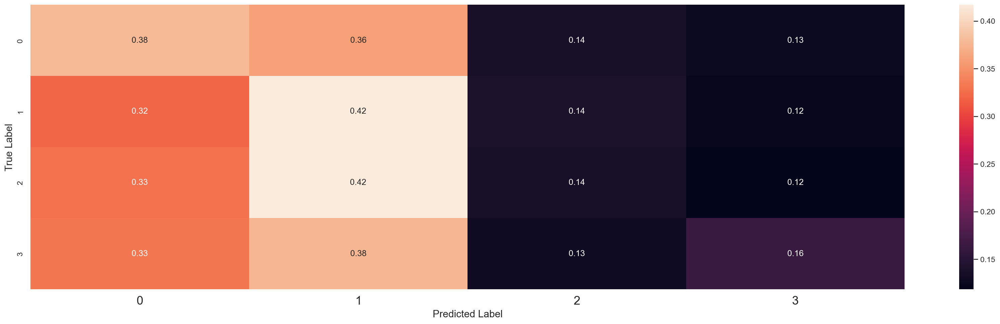

In [123]:
# normalising and viewing the confusion matrix
plt.clf()
sub_knn_conf_matrix_norm = sub_knn_conf_matrix.astype('float') / sub_knn_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_knn_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [124]:
# calculating metrics for the prediction
sub_knn_metrics = metrics.classification_report(y_test, sub_knn_test_prediction,target_names=grouped_categories)
print(sub_knn_metrics)

              precision    recall  f1-score   support

    computer       0.34      0.38      0.36      1955
  recreation       0.26      0.42      0.32      1590
     science       0.25      0.14      0.18      1579
        talk       0.25      0.16      0.20      1301

    accuracy                           0.28      6425
   macro avg       0.28      0.27      0.26      6425
weighted avg       0.28      0.28      0.27      6425



### 3.2.3 Hyperparameters Tuning

##### **Grid Search Cross Validation**

In [125]:
# initializing grid search cross validation for hyperparameter tuning
neighbour_values=[]
for i in range(1,15):
  neighbour_values.append(i)
weight_values=['uniform', 'distance']
leaf_values = [30,40,50,60]

sub_knn_parameters_dict = dict(n_neighbors=neighbour_values, weights=weight_values,leaf_size=leaf_values)
sub_knn_grid = GridSearchCV(sub_knn_clf, sub_knn_parameters_dict, cv=5, scoring='accuracy', n_jobs=10)
sub_knn_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(n_neighbors=4), n_jobs=10,
             param_grid={'leaf_size': [30, 40, 50, 60],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [126]:
# viewing the best parameters
print(sub_knn_grid.best_params_)

{'leaf_size': 30, 'n_neighbors': 2, 'weights': 'distance'}


##### **Retraining**

In [127]:
# reinitializing and refitting the KNN Classifier
sub_knn_ht_clf = KNeighborsClassifier(n_neighbors=2,weights='distance',leaf_size=30)
sub_knn_ht_clf.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=2, weights='distance')

##### **Revaluation**

In [128]:
# recalculating training accuracy
sub_knn_ht_train_prediction = sub_knn_ht_clf.predict(X_train)
sub_knn_ht_train_accuracy = accuracy_score(y_train,sub_knn_ht_train_prediction)
print("Training Accuracy with tuned Hyperparameters:",sub_knn_ht_train_accuracy*100)
sub_category_train_accuracy.append(sub_knn_ht_train_accuracy)

# recalculating testing accuracy
sub_knn_ht_test_prediction = sub_knn_ht_clf.predict(X_test)
sub_knn_ht_test_accuracy = accuracy_score(y_test, sub_knn_ht_test_prediction)
print("Testing Accuracy with tuned Hyperparameters:",sub_knn_ht_test_accuracy*100)
sub_category_test_accuracy.append(sub_knn_ht_test_accuracy)

Training Accuracy with tuned Hyperparameters: 97.83419689119171
Testing Accuracy with tuned Hyperparameters: 29.71206225680934


In [129]:
# creating the confusion matrix
sub_knn_ht_conf_matrix = confusion_matrix(y_test, sub_knn_ht_test_prediction)

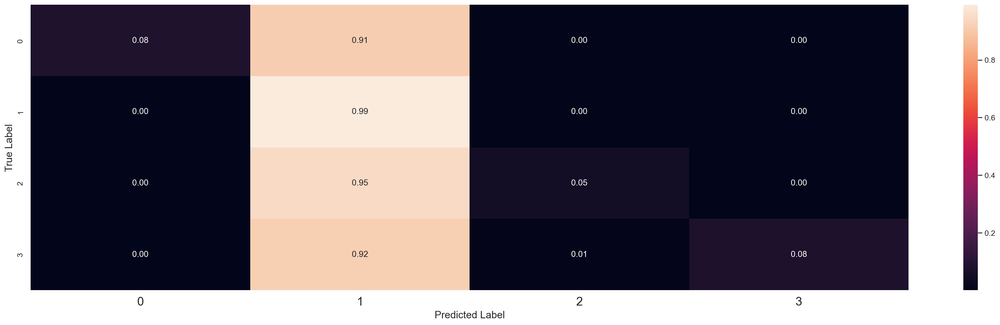

In [130]:
# renormalising and reviewing the confusion matrix
plt.clf()
sub_knn_ht_conf_matrix_norm = sub_knn_ht_conf_matrix.astype('float') / sub_knn_ht_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_knn_ht_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [131]:
# calculating metrics for the prediction
sub_knn_ht_metrics = metrics.classification_report(y_test, sub_knn_ht_test_prediction,target_names=grouped_categories)
print(sub_knn_ht_metrics)

              precision    recall  f1-score   support

    computer       0.95      0.08      0.15      1955
  recreation       0.26      0.99      0.41      1590
     science       0.74      0.05      0.09      1579
        talk       0.92      0.08      0.14      1301

    accuracy                           0.30      6425
   macro avg       0.72      0.30      0.20      6425
weighted avg       0.72      0.30      0.20      6425



## 3.3 Support Vector Machine Classifier

### 3.3.1 Training

In [132]:
# initializing and fitting the SVM classifier
sub_svm_clf = LinearSVC(penalty='l2', loss='squared_hinge', dual=False, multi_class='ovr', max_iter=1000)
sub_svm_clf.fit(X_train,y_train)

LinearSVC(dual=False)

### 3.3.2 Evaluation

In [133]:
# calculating training accuracy
sub_svm_train_prediction = sub_svm_clf.predict(X_train)
sub_svm_train_accuracy = accuracy_score(y_train,sub_svm_train_prediction)
print("Training Accuracy:",sub_svm_train_accuracy*100)
sub_category_train_accuracy.append(sub_svm_train_accuracy)

# calculating testing accuracy
sub_svm_test_prediction = sub_svm_clf.predict(X_test)
sub_svm_test_accuracy = accuracy_score(y_test, sub_svm_test_prediction)
print("Testing Accuracy:",sub_svm_test_accuracy*100)
sub_category_test_accuracy.append(sub_svm_test_accuracy)

Training Accuracy: 97.62694300518135
Testing Accuracy: 83.81322957198444


In [134]:
# creating the confusion matrix
sub_svm_conf_matrix = confusion_matrix(y_test, sub_svm_test_prediction)

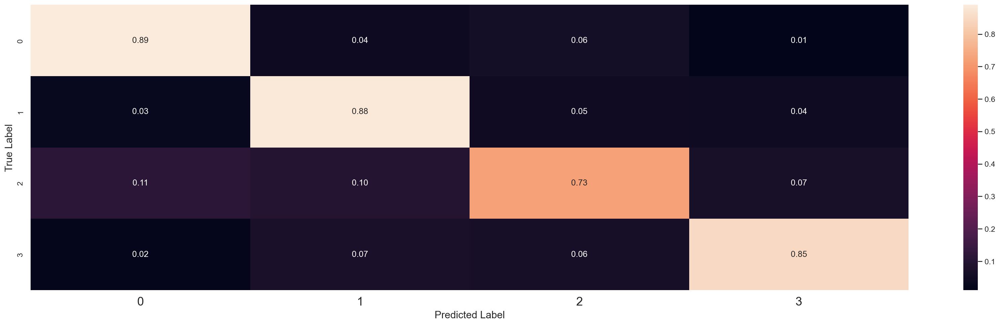

In [135]:
# normalizing and viewing the confusion matrix
plt.clf()
sub_svm_conf_matrix_norm = sub_svm_conf_matrix.astype('float') / sub_svm_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_svm_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [136]:
# calculating metrics for the prediction
sub_svm_metrics = metrics.classification_report(y_test, sub_svm_test_prediction,target_names=grouped_categories)
print(sub_svm_metrics)

              precision    recall  f1-score   support

    computer       0.87      0.89      0.88      1955
  recreation       0.81      0.88      0.84      1590
     science       0.81      0.73      0.77      1579
        talk       0.85      0.85      0.85      1301

    accuracy                           0.84      6425
   macro avg       0.84      0.84      0.83      6425
weighted avg       0.84      0.84      0.84      6425



### 3.3.3 Hyperparameters Tuning

##### **Grid Search Cross Validation**

In [137]:
# intializing grid search cross validation for hyperparameter tuning
penalty_values=['l1','l2']
tolerance_values = [0.1,0.001]
C_values=[2,5,10]
sub_svm_parameters_dict = dict(penalty=penalty_values, C=C_values, tol=tolerance_values)
sub_svm_grid = GridSearchCV(sub_svm_clf, sub_svm_parameters_dict, cv=5, scoring='accuracy', n_jobs=10)
sub_svm_grid.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=LinearSVC(dual=False), n_jobs=10,
             param_grid={'C': [2, 5, 10], 'penalty': ['l1', 'l2'],
                         'tol': [0.1, 0.001]},
             scoring='accuracy')

In [138]:
# viewing the best parameters
print(sub_svm_grid.best_params_)

{'C': 2, 'penalty': 'l2', 'tol': 0.1}


##### **Retraining**

In [139]:
# reinitializing and refitting the SVM classifier
sub_svm_ht_clf = LinearSVC(penalty='l2', loss='squared_hinge', dual=False, multi_class='ovr', max_iter=1000, C=2, tol=0.1)
sub_svm_ht_clf.fit(X_train,y_train)

LinearSVC(C=2, dual=False, tol=0.1)

##### **Revaluation**

In [140]:
# recalculating training accuracy
sub_svm_ht_train_prediction = sub_svm_ht_clf.predict(X_train)
sub_svm_ht_train_accuracy = accuracy_score(y_train,sub_svm_ht_train_prediction)
print("Training Accuracy with tuned hyperparameters:",sub_svm_ht_train_accuracy*100)
sub_category_train_accuracy.append(sub_svm_ht_train_accuracy)

# recalculating testing accuracy
sub_svm_ht_test_prediction = sub_svm_ht_clf.predict(X_test)
sub_svm_ht_test_accuracy = accuracy_score(y_test, sub_svm_ht_test_prediction)
print("Testing Accuracy with tuned hyperparameters:",sub_svm_ht_test_accuracy*100)
sub_category_test_accuracy.append(sub_svm_ht_test_accuracy)

Training Accuracy with tuned hyperparameters: 96.69430051813471
Testing Accuracy with tuned hyperparameters: 83.93774319066148


In [141]:
# creating the confusion matrix
sub_svm_ht_conf_matrix = confusion_matrix(y_test, sub_svm_ht_test_prediction)

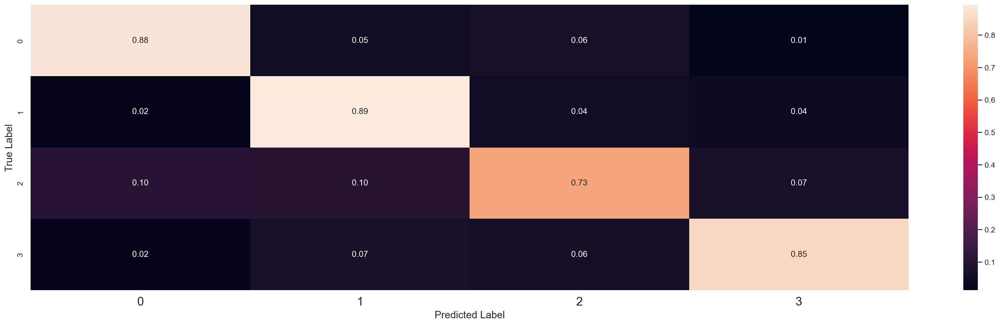

In [142]:
# renormalizing and reviewing the confusion matrix
plt.clf()
sub_svm_ht_conf_matrix_norm = sub_svm_ht_conf_matrix.astype('float') / sub_svm_ht_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_svm_ht_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [143]:
# calculating metrics for the prediction
sub_svm_ht_metrics = metrics.classification_report(y_test, sub_svm_ht_test_prediction, target_names=grouped_categories)
print(sub_svm_ht_metrics)

              precision    recall  f1-score   support

    computer       0.89      0.88      0.88      1955
  recreation       0.81      0.89      0.85      1590
     science       0.80      0.73      0.77      1579
        talk       0.84      0.85      0.84      1301

    accuracy                           0.84      6425
   macro avg       0.84      0.84      0.84      6425
weighted avg       0.84      0.84      0.84      6425



## 3.4 Multinomial Naive Bayes Classifier

### 3.4.1 Training

In [144]:
# initializing and fitting the Multinomial Naive Bayes Classifier
sub_mnb_clf = MultinomialNB(alpha=0.1)
sub_mnb_clf.fit(X_train,y_train)

MultinomialNB(alpha=0.1)

### 3.4.2 Evaluation

In [145]:
# calculating training accuracy
sub_mnb_train_prediction = sub_mnb_clf.predict(X_train)
sub_mnb_train_accuracy = accuracy_score(y_train, sub_mnb_train_prediction)
print("Training Accuracy:",sub_mnb_train_accuracy*100)
sub_category_train_accuracy.append(sub_mnb_train_accuracy)

# calculating the testing accuracy 
sub_mnb_test_prediction = sub_mnb_clf.predict(X_test)
sub_mnb_test_accuracy= accuracy_score(y_test, sub_mnb_test_prediction)
print("Testing Accuracy:",sub_mnb_test_accuracy*100)
sub_category_test_accuracy.append(sub_mnb_test_accuracy)

Training Accuracy: 93.25388601036269
Testing Accuracy: 84.90272373540856


In [146]:
# creating the confusion matrix
sub_mnb_conf_matrix = confusion_matrix(y_test, sub_mnb_test_prediction)

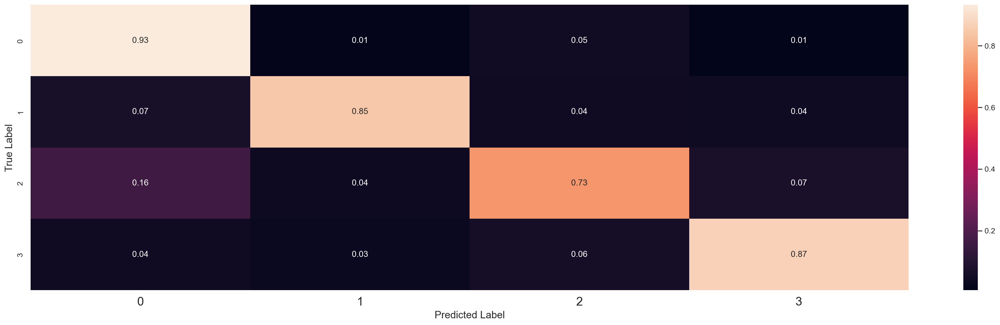

In [147]:
# normalising and viewing the confusion matrix
plt.clf()
sub_mnb_conf_matrix_norm = sub_mnb_conf_matrix.astype('float') / sub_mnb_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_mnb_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [148]:
# calculating metrics for the prediction
sub_mnb_metrics = metrics.classification_report(y_test, sub_mnb_test_prediction,target_names=grouped_categories)
print(sub_mnb_metrics)

              precision    recall  f1-score   support

    computer       0.81      0.93      0.87      1955
  recreation       0.92      0.85      0.88      1590
     science       0.83      0.73      0.78      1579
        talk       0.85      0.87      0.86      1301

    accuracy                           0.85      6425
   macro avg       0.85      0.84      0.85      6425
weighted avg       0.85      0.85      0.85      6425



### 3.4.3 Hyperparameters Tuning

##### **Grid Search Cross Validation**

In [149]:
# initializing Grid Search Cross Validation for hyperparameter tuning
alpha_range = [0.0001, 0.001, 0.01, 0.2, 0.5, 0.7, 1, 2, 5, 8, 9, 10]
fit_vals=[True,False]
sub_mnb_parameters_dict = dict(alpha=alpha_range,fit_prior=fit_vals)
sub_mnb_grid = GridSearchCV(sub_mnb_clf, sub_mnb_parameters_dict, cv=5, scoring='accuracy', n_jobs=10)
sub_mnb_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=MultinomialNB(alpha=0.1), n_jobs=10,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.2, 0.5, 0.7, 1, 2, 5,
                                   8, 9, 10],
                         'fit_prior': [True, False]},
             scoring='accuracy')

In [150]:
# viewing the best parameters
sub_mnb_grid.best_params_

{'alpha': 0.2, 'fit_prior': False}

##### **Retraining**

In [151]:
# reinitializing and refitting the Multinomial Naive Bayes Classifier
sub_mnb_ht_clf = MultinomialNB(alpha=0.2,fit_prior=False)
sub_mnb_ht_clf.fit(X_train,y_train)

MultinomialNB(alpha=0.2, fit_prior=False)

##### **Revaluation**

In [152]:
# recalculating training accuracy
sub_mnb_ht_train_prediction = sub_mnb_ht_clf.predict(X_train)
sub_mnb_ht_train_accuracy = accuracy_score(y_train, sub_mnb_ht_train_prediction)
print("Training Accuracy with tuned hyperparameters:",sub_mnb_ht_train_accuracy*100)
sub_category_train_accuracy.append(sub_mnb_ht_train_accuracy)

# recalculating testing accuracy
sub_mnb_ht_test_prediction = sub_mnb_ht_clf.predict(X_test)
sub_mnb_ht_test_accuracy= accuracy_score(y_test, sub_mnb_ht_test_prediction)
print("Testing Accuracy with tuned hyperparameters:",sub_mnb_ht_test_accuracy*100)
sub_category_test_accuracy.append(sub_mnb_ht_test_accuracy)

Training Accuracy with tuned hyperparameters: 92.860103626943
Testing Accuracy with tuned hyperparameters: 85.08949416342413


In [153]:
# creating the confusion matrix
sub_mnb_ht_conf_matrix = confusion_matrix(y_test, sub_mnb_ht_test_prediction)

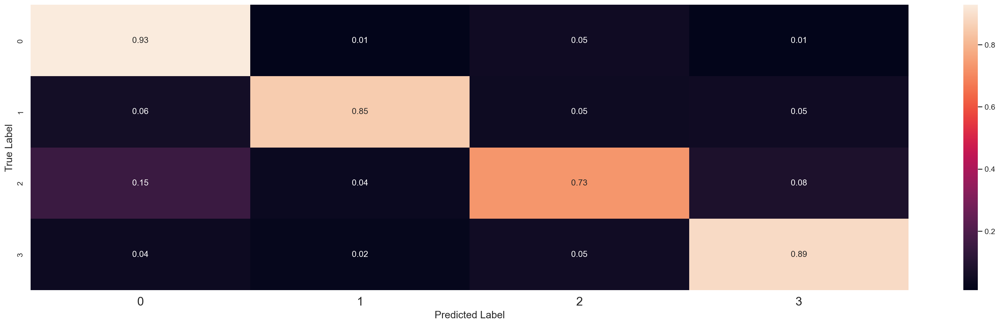

In [154]:
# renormalising and viewing the confusion matrix
plt.clf()
sub_mnb_ht_conf_matrix_norm = sub_mnb_ht_conf_matrix.astype('float') / sub_mnb_ht_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_mnb_ht_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

In [155]:
# recalculating metrics for the prediction
sub_mnb_ht_metrics = metrics.classification_report(y_test, sub_mnb_ht_test_prediction,target_names=grouped_categories)
print(sub_mnb_ht_metrics)

              precision    recall  f1-score   support

    computer       0.82      0.93      0.87      1955
  recreation       0.92      0.85      0.88      1590
     science       0.83      0.73      0.78      1579
        talk       0.84      0.89      0.86      1301

    accuracy                           0.85      6425
   macro avg       0.85      0.85      0.85      6425
weighted avg       0.85      0.85      0.85      6425



## 3.5 Logistic Regression

### 3.5.1 Training

In [156]:
# initializing and fitting the Logistic Regression Classifier
sub_lr_clf = LogisticRegression(multi_class='multinomial', solver='lbfgs')
sub_lr_clf.fit(X_train, y_train)

LogisticRegression(multi_class='multinomial')

### 3.5.2 Evaluation

In [158]:
# calculating training accuracy
sub_lr_train_prediction = sub_lr_clf.predict(X_train)
sub_lr_train_accuracy = accuracy_score(y_train, sub_lr_train_prediction)
print("Training Accuracy:",sub_lr_train_accuracy*100)
sub_category_train_accuracy.append(sub_lr_train_accuracy)

# calculating the testing accuracy 
sub_lr_test_prediction = sub_lr_clf.predict(X_test)
sub_lr_test_accuracy= accuracy_score(y_test, sub_lr_test_prediction)
print("Testing Accuracy:",sub_lr_test_accuracy*100)
sub_category_test_accuracy.append(sub_lr_test_accuracy)

Training Accuracy: 94.50777202072538
Testing Accuracy: 84.01556420233463


In [159]:
# creating the confusion matrix
sub_lr_conf_matrix = confusion_matrix(y_test, sub_lr_test_prediction)

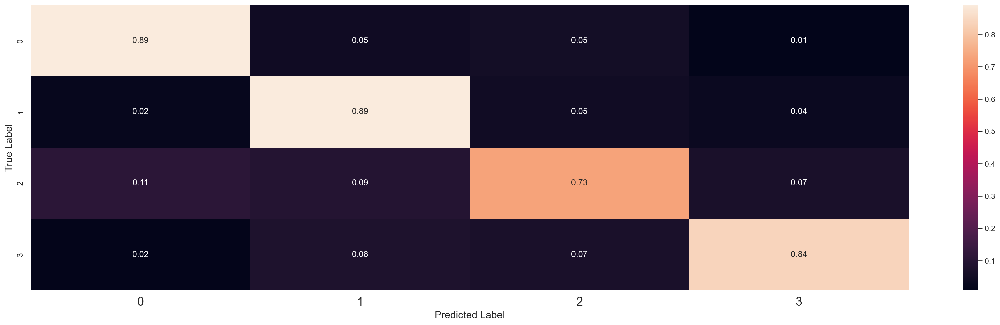

In [160]:
# normalising and viewing the confusion matrix
plt.clf() # clear previous diagrams
sub_lr_conf_matrix_norm = sub_lr_conf_matrix.astype('float') / sub_lr_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_lr_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

## 3.6 Logistic Regression (One-vs-all)

### 3.6.1 Training

In [161]:
# initializing and fitting the Logistic Regression Classifier
sub_lrovr_clf = LogisticRegression(multi_class='ovr')
sub_lrovr_clf.fit(X_train, y_train)

LogisticRegression(multi_class='ovr')

### 3.6.2 Evaluation

In [162]:
# calculating training accuracy
sub_lrovr_train_prediction = sub_lrovr_clf.predict(X_train)
sub_lrovr_train_accuracy = accuracy_score(y_train, sub_lrovr_train_prediction)
print("Training Accuracy:",sub_lrovr_train_accuracy*100)
sub_category_train_accuracy.append(sub_lrovr_train_accuracy)

# calculating the testing accuracy 
sub_lrovr_test_prediction = sub_lrovr_clf.predict(X_test)
sub_lrovr_test_accuracy= accuracy_score(y_test, sub_lrovr_test_prediction)
print("Testing Accuracy:",sub_lrovr_test_accuracy*100)
sub_category_test_accuracy.append(sub_lrovr_test_accuracy)

Training Accuracy: 93.26424870466322
Testing Accuracy: 83.71984435797665


In [163]:
# creating the confusion matrix
sub_lrovr_conf_matrix = confusion_matrix(y_test, sub_lrovr_test_prediction)

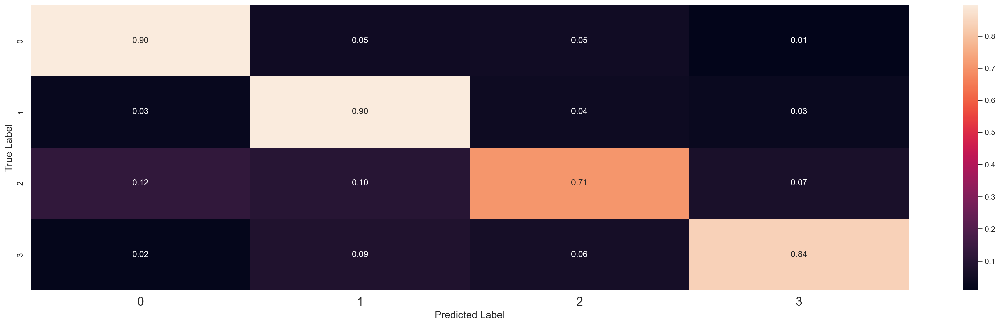

In [164]:
# normalising and viewing the confusion matrix
plt.clf() # clear previous diagrams
sub_lrovr_conf_matrix_norm = sub_lrovr_conf_matrix.astype('float') / sub_lrovr_conf_matrix.sum(axis=1)[:, np.newaxis]
ax = sns.heatmap(sub_lrovr_conf_matrix_norm, annot=True,fmt='.2f')
ax.set_xlabel('Predicted Label');
ax.set_ylabel('True Label');
plt.show()

## 3.7 Performance Comparision

### 3.7.1 Accuray

In [167]:
print("Length of classification_models:", len(classification_models))
print("Length of sub_category_train_accuracy:", len(sub_category_train_accuracy))
print("Length of sub_category_test_accuracy:", len(sub_category_test_accuracy))


Length of classification_models: 8
Length of sub_category_train_accuracy: 9
Length of sub_category_test_accuracy: 9


In [168]:
if len(classification_models) < len(sub_category_train_accuracy):
    classification_models.extend(["Model {}".format(i) for i in range(len(classification_models), len(sub_category_train_accuracy))])


In [169]:
# comparing training and testing accuracies
sub_model_acc_compare = pd.DataFrame({'Algorithm' : classification_models, 'Training_Accuracy' : sub_category_train_accuracy, 'Testing_Accuracy' : sub_category_test_accuracy})
sub_model_acc_compare.sort_values(by='Testing_Accuracy', ascending=False)

,Algorithm,Training_Accuracy,Testing_Accuracy
5,Multinomial Naive Bayes Hypertuned,0.928601,0.850895
4,Multinomial Naive Bayes,0.932539,0.849027
6,Logistic Regression Multiclass,0.945078,0.840156
7,Logistic Regression One-vs-all,0.945078,0.840156
3,Support Vector Machine Hypertuned,0.966943,0.839377
2,Support Vector Machine,0.976269,0.838132
8,Model 8,0.932642,0.837198
1,K Nearest Neighbor Hypertuned,0.978342,0.297121
0,K Nearest Neighbor,0.594922,0.284981


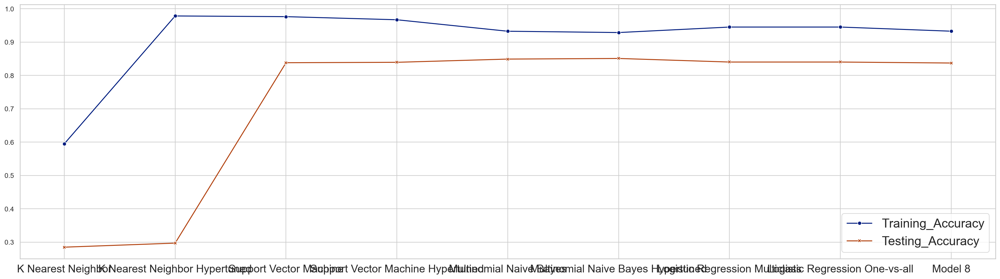

In [170]:
# visualizing the training and testing accuracies
plt.clf()
ax = sns.lineplot(data=[sub_model_acc_compare['Training_Accuracy'], sub_model_acc_compare['Testing_Accuracy']], dashes=False, markers=True)
ax.set_xticks(range(len(sub_model_acc_compare['Algorithm'])))
ax.set_xticklabels(sub_model_acc_compare['Algorithm'])
plt.show()

### ✏️ Observe the results above and discuss the following:
- Compare these new class results with the 17-category ones we saw previously. Does the overall performance improve? Why?

A:
類別數量減少降低了分類難度，分組後數據更均衡，類別間的邏輯分佈更明確。

- Do models behave the same (e.g., overfitting and underfitting)?

KNN仍然過擬合，但分組後略有改善。SVM 和 Logistic Regression的泛化能力提高，測試準確率進一步接近訓練準確率，Multinomial Naive Bayes還是一樣表現最佳，充分受益於分組後的類別結構。


### 3.7.2 Holistic Comparision

In [171]:
# calculating all the performance metrics
sub_precision_score.extend([metrics.precision_score(y_test, sub_knn_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_knn_ht_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_svm_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_svm_ht_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_mnb_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_mnb_ht_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_lr_test_prediction,average="weighted")*100,
                           metrics.precision_score(y_test, sub_lrovr_test_prediction,average="weighted")*100])

sub_recall_score.extend([metrics.recall_score(y_test, sub_knn_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_knn_ht_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_svm_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_svm_ht_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_mnb_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_mnb_ht_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_lr_test_prediction,average="weighted")*100,
                         metrics.recall_score(y_test, sub_lrovr_test_prediction,average="weighted")*100])

sub_f1_score.extend([metrics.f1_score(y_test, sub_knn_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_knn_ht_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_svm_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_svm_ht_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_mnb_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_mnb_ht_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_lr_test_prediction,average="weighted")*100,
                     metrics.f1_score(y_test, sub_lrovr_test_prediction,average="weighted")*100])

In [176]:
# displaying all the performance metrics
sub_comp_metric = pd.DataFrame({'Model' : classification_models,
                       'Precision' : sub_precision_score,
                       'Recall' : sub_recall_score,
                       'F1' : sub_f1_score,
                       'Test_Accuracy' : sub_category_test_accuracy},
                       index=["", "", "","","","","","4 Clubbed Groups"])

sub_comp_metric.sort_values(by='Test_Accuracy', ascending=False, inplace=True)
sub_comp_metric

,Model,Precision,Recall,F1,Test_Accuracy
,Multinomial Naive Bayes Hypertuned,85.283417,85.089494,84.961268,0.850895
,Multinomial Naive Bayes,85.120560,84.902724,84.783087,0.849027
,Logistic Regression Multiclass,84.021629,84.015564,83.909249,0.840156
4 Clubbed Groups,Logistic Regression One-vs-all,83.776521,83.719844,83.555415,0.840156
,Support Vector Machine Hypertuned,83.962498,83.937743,83.856660,0.839377
,Support Vector Machine,83.778604,83.813230,83.701861,0.838132
,K Nearest Neighbor Hypertuned,72.051484,29.712062,19.809754,0.297121
,K Nearest Neighbor,27.962012,28.498054,27.183151,0.284981


The above table shows metrics for the 4 clubbed groups. The detail comparison can be found in the **'Comparing Final Metrics'** section

# 4. Overview of Test Performance

## 4.1 Accuracy

In [177]:
# comparing the testing accuracies of the 4 clubbed groups and 17 individual groups
final_accuracy_compare = pd.DataFrame({'Algorithm' : classification_models, '17_Individual_Groups_Testing_Accuracy' : all_category_test_accuracy, '4_Clubbed_Groups_Testing_Accuracy' : sub_category_test_accuracy})
final_accuracy_compare.sort_values(by='4_Clubbed_Groups_Testing_Accuracy', ascending=False)

,Algorithm,17_Individual_Groups_Testing_Accuracy,4_Clubbed_Groups_Testing_Accuracy
5,Multinomial Naive Bayes Hypertuned,0.717354,0.850895
4,Multinomial Naive Bayes,0.715642,0.849027
6,Logistic Regression Multiclass,0.705681,0.840156
7,Logistic Regression One-vs-all,0.707082,0.840156
3,Support Vector Machine Hypertuned,0.701012,0.839377
2,Support Vector Machine,0.698988,0.838132
1,K Nearest Neighbor Hypertuned,0.120156,0.297121
0,K Nearest Neighbor,0.092607,0.284981


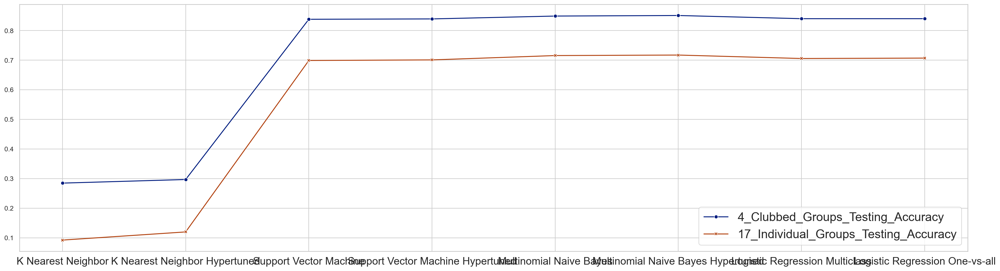

In [178]:
# visualizing the testing accuracies of the 4 clubbed groups and 17 individual groups
plt.clf()
ax = sns.lineplot(data=[final_accuracy_compare['4_Clubbed_Groups_Testing_Accuracy'], final_accuracy_compare['17_Individual_Groups_Testing_Accuracy']], dashes=False, markers=True)
ax.set_xticks(range(len(final_accuracy_compare['Algorithm'])))
ax.set_xticklabels(final_accuracy_compare['Algorithm'])
plt.show()

## 4.2 Holistic Performance

In [179]:
# comparing the performance metrics of the 4 clubbed groups and 17 individual groups
final_metric_compare = pd.concat([sub_comp_metric, all_comp_metric])
final_metric_compare

,Model,Precision,Recall,F1,Test_Accuracy
,Multinomial Naive Bayes Hypertuned,85.283417,85.089494,84.961268,0.850895
,Multinomial Naive Bayes,85.120560,84.902724,84.783087,0.849027
,Logistic Regression Multiclass,84.021629,84.015564,83.909249,0.840156
4 Clubbed Groups,Logistic Regression One-vs-all,83.776521,83.719844,83.555415,0.840156
,Support Vector Machine Hypertuned,83.962498,83.937743,83.856660,0.839377
,Support Vector Machine,83.778604,83.813230,83.701861,0.838132
,K Nearest Neighbor Hypertuned,72.051484,29.712062,19.809754,0.297121
,K Nearest Neighbor,27.962012,28.498054,27.183151,0.284981
,Multinomial Naive Bayes Hypertuned,73.244124,71.735409,72.097104,0.717354
,Multinomial Naive Bayes,72.279256,71.564202,71.485143,0.715642


### ✏️ Observe the results above and discuss the following:
- Which classifier showed the highest improvement in accuracy when switching from 17 individual groups to 4 clubbed groups? Why do you think this happened?

A:
Multinomial Naive Bayes Hypertuned 提升最多，從 71.7% 提升到 85.1%。因為 Naive Bayes 假設特徵之間獨立，當分類數量減少時，模型的錯誤累積機會降低，分界線變得更簡單，因此效果提升明顯。

- The logistic regression classifiers (multiclass and one-vs-all) show similar performance with both group setups. What might explain this behavior?

A:
Logistic Regression（Multiclass 和 One-vs-All）的表現差異不大，準確率都在約 84%。Logistic Regression 的權重學習方式在類別數減少時對模型影響較小，能有效找到類別之間的最佳分界，分類類別數的變化對其影響有限。

- How does reducing the number of groups (from 17 to 4) impact the classifier's ability to generalize? Discuss how this might affect its performance in real-world applications.

A:
分類數量減少讓模型更容易泛化，因為類別之間的相似性降低，分類邊界更清晰，也可能導致丟失細粒度信息，像是無法區分某些具體類別。如果目標是進行粗略分類，例如高層次分析或快速分類，4 類模型更適合。如果需要精確分類或細分應用，例如客戶行為分析或醫學診斷，17 類模型更合適。

- In a real-world scenario, would you prefer a model trained with 17 individual groups or 4 clubbed groups? Justify your choice based on performance and potential use cases.

A:

選擇 4 適合於快速決策或需要大類別區分的場景，例如新聞分組或消費者類型分析，高準確率和簡單分類邏輯使其適用於大規模應用。選擇 17 適合需要細粒度分類的場合，例如技術支持分類或醫療分類任務，準確率稍低，但能提供更具體的信息。

# 5. ✏️ Additional Analyses on Classification

## 5.1 Word2Vec Results
Show the performance of 20 Newsgroups classification using Word2Vec embeddings as document features. Compare the results with those obtained using TF-IDF features.

A:

Word2Vec 的性能可能在語義豐富但詞頻不明顯的情境中優於 TF-IDF，像是主題模糊的類別。TF-IDF 通常在數據集中類別區分明顯且詞頻信息重要時表現更好。

## 5.2 Cross-validation Results

The experiments we have conducted so far are based on a fixed train-test split. Such a setting might be problematic under certain circumstances, and cross-validation is often introduced to address this limitation.

- What is the main limitation of a fixed train-test split?  

A:

模型的性能高度依賴於數據分割方式，可能因分割樣本分布不均導致過於樂觀或悲觀的估計，單次分割無法全面衡量模型的泛化能力。

- Use the cross-validation package provided by scikit-learn to show the classification results of a hyper-tuned Multinomial Naive Bayes model under a 10-fold cross-validation setting. What do you observe from the results?

A:

10-Fold Cross-Validation 提供更穩定的性能估計，避免固定分割中樣本分布帶來的偏差，可以看到模型在不同分割上的性能略有波動，但整體平均值會更接近模型的實際泛化能力，如果模型在每一Fold的結果差異小，說明數據集的分布較均勻，如果波動大，則數據分布或類別不平衡可能對性能影響顯著。


# 6. Clustering

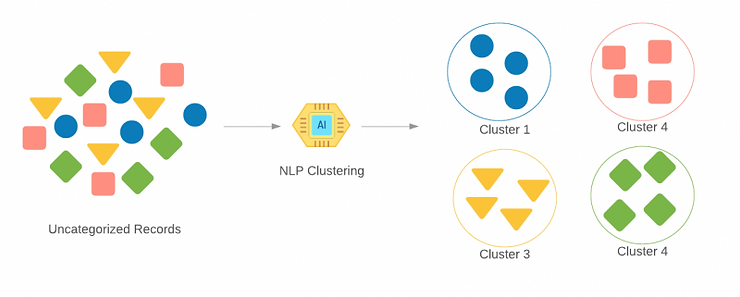
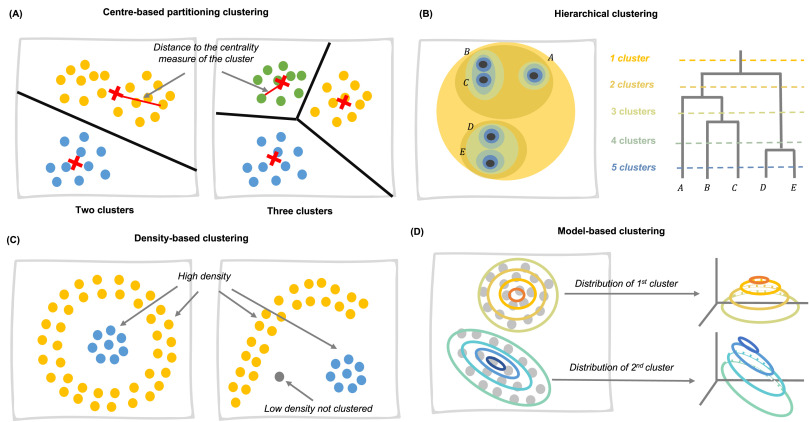

## 6.1 K-Means Clustering

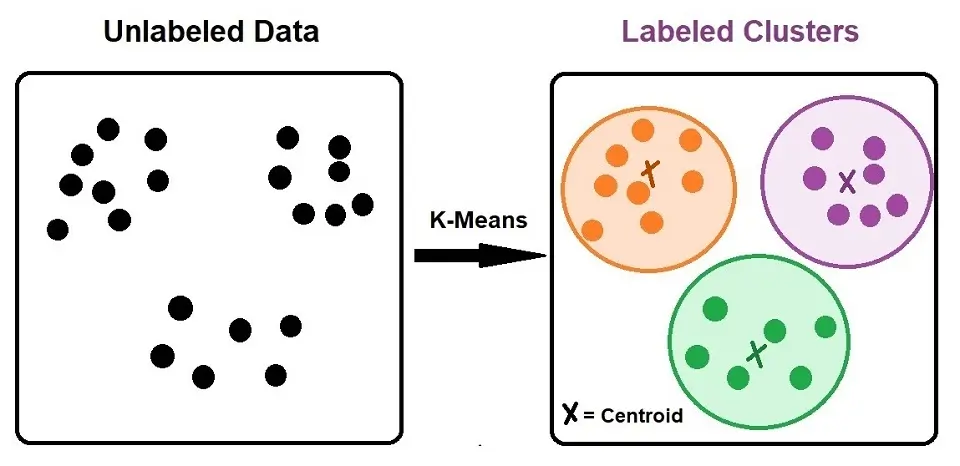
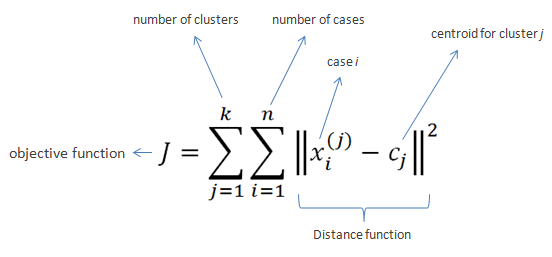


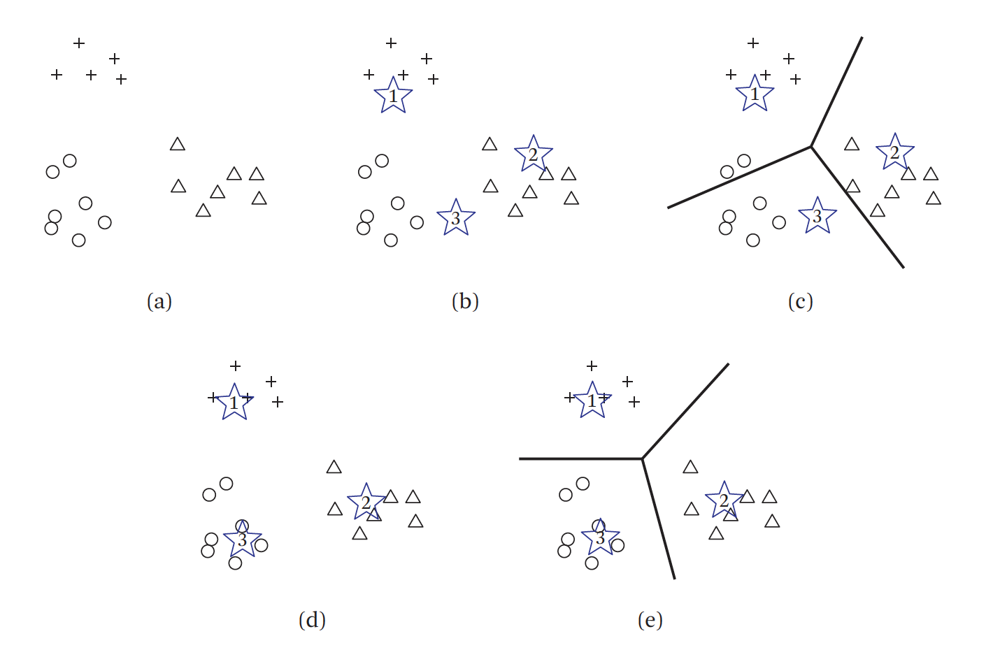
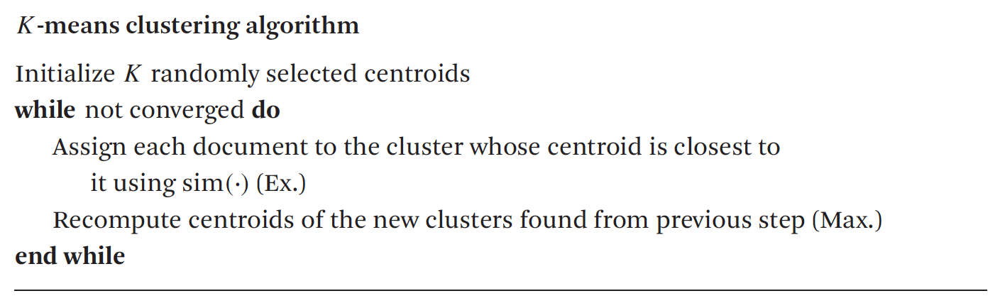

**This iteractive process is called an Expectation Maximixation process**
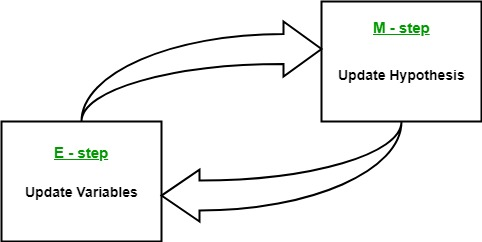

### 6.1.1 Determining k - Elbow Method

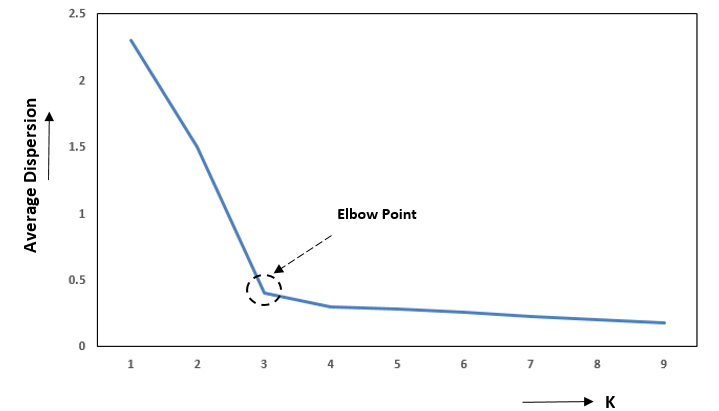

The intertia formula:</br>
$\sum_{i=1}^N(x_i-C_k)^2$, where $x_i$ is a document of class $k$, and $C_k$ is the center of cluster $k$.

In [180]:
# calculating inertia to determine the optimal value of k i.e. number of clusters
inertia = []
for k in range(1,20):
   kmeans = KMeans(n_clusters=k, max_iter=300, n_init=10)
   kmeans = kmeans.fit(X_train)
   inertia.append(kmeans.inertia_)

<Figure size 3750x1050 with 0 Axes>

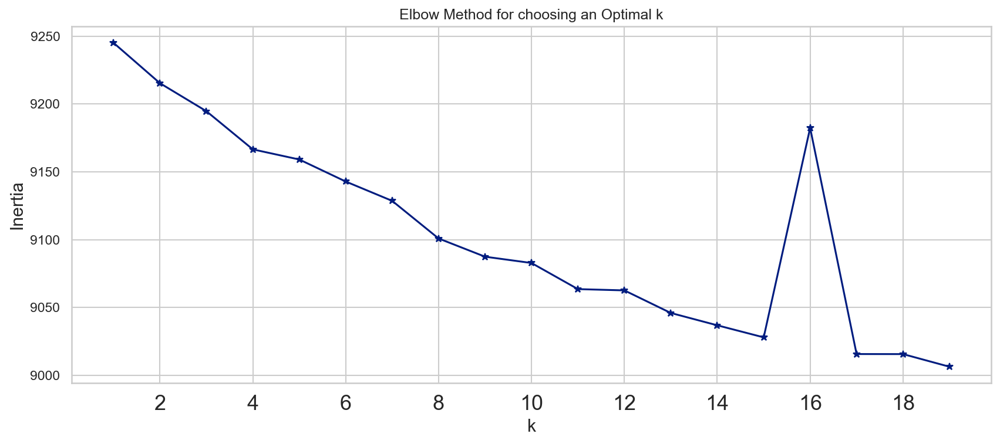

In [181]:
# plotting the results to get the elbow point
plt.clf()
plt.figure(figsize=(12, 5))
plt.plot(range(1,20), inertia, '*-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('Elbow Method for choosing an Optimal k')
plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
plt.show()

### ✏️ Observe the results above and discuss the following:
- Unfortunately, there is no clear $k$ that forms an elbow. This might be due to the fact that the feature space is very high-dimensional. Try to represent the documents using 128-dimensional word2vec embeddings and see if you observe a clearer elbow.

改變中心點，不斷迭代直到兩邊都不會再動，得到蠻ＯＫ的分群結果
Elbow Method找到手肘的那個點，得到要分幾群, 每個instance和中心點的距離，intertia應該越來越小，群數越高沒有意義，看到elbow圖一直向下為什麼？
每個群不知道是什麼意思，需要自己去看有哪些特徵

In [182]:
# We will just use the number of categories as the k here
chosen_k = 4

### 6.1.2 Applying K-Means Algorithm

In [183]:
# initializing kmeans with chosen_k centroids
kmeans = KMeans(n_clusters=chosen_k, init='k-means++', max_iter=200, n_init=10)

# fitting the model to the training data
kmeans.fit(X_train)

KMeans(max_iter=200, n_clusters=4, n_init=10)

In [184]:
# storing the cluster labels
cluster_label = kmeans.labels_

In [185]:
# viewing the cluster labels
cluster_label

array([1, 3, 2, ..., 1, 1, 0])

## 6.2 Analysis

Unlike classification, in the problem setting for clustering, we do not have labels for each document. As a result, evaluation metrics such as accuracy, precision, and recall are no longer applicable. Instead, we will use qualitative analysis to evaluate how the model performs.

### 6.2.1 Dimension Reduction with Principal Component Analysis (PCA)

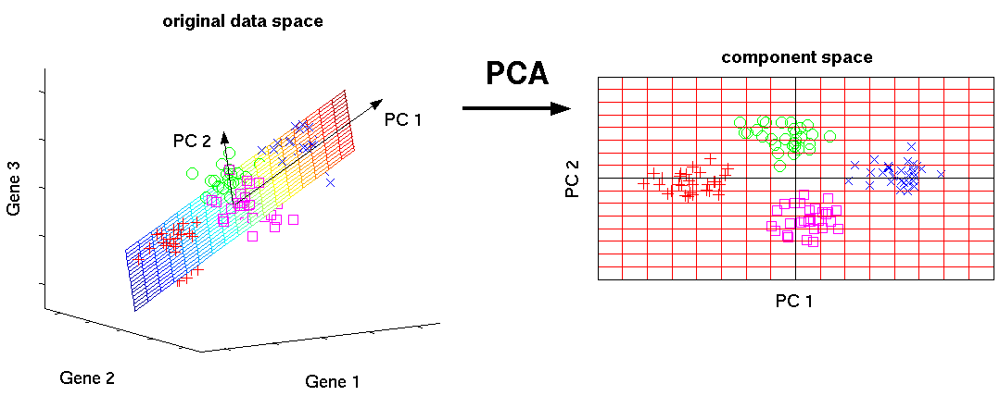

In [186]:
# viewing the shape of the training data
X_train.shape

(9650, 14798)

In [187]:
# initializing PCA with 2 components
pca = PCA(n_components=2, random_state=42)

# reducing the dimensionality
component_vectors = pca.fit_transform(X_train.toarray())

In [188]:
# viewing the component vectors
component_vectors

array([[-0.10248158,  0.07648162],
       [-0.02988199,  0.02329773],
       [ 0.03859736,  0.03686536],
       ...,
       [-0.08154973,  0.07743482],
       [-0.05135026, -0.02550783],
       [-0.03210275, -0.36567149]])

In [189]:
# storing the two dimensions
dimension_one = component_vectors[:, 0]
dimension_two = component_vectors[:, 1]

In [190]:
# creating a new dataframe with details of allotted cluster and new dimensions
df_dimension_reduced_cluster = pd.DataFrame({'post' : X_train_data['post'], 'preprocessed_post' : X_train_data['preprocessed_post'], 'dimension_one' : dimension_one, 'dimension_two' : dimension_two, 'cluster_label' : cluster_label})

In [191]:
# viewing the new dimensionaly reduced clustered dataframe
df_dimension_reduced_cluster

,post,preprocessed_post,dimension_one,dimension_two,cluster_label
0,\n\nThere were many injustices in the middle a...,many injustices middle ages truely sad would h...,-0.102482,0.076482,1
1,\n\nThis actually supports Bill's speculation ...,actually supports bill speculation backdoor rs...,-0.029882,0.023298,3
2,\nApplied Engineering makes a NuBus card calle...,applied engineering makes nubus card called qu...,0.038597,0.036865,2
3,Mark McWiggins <markmc@halcyon.com> reminds us...,mark mcwiggins markmc halcyon com reminds us m...,-0.065279,0.033008,1
4,"\nExcellently put!\n\nEven as a libertarian, I...",excellently put even libertarian admit governm...,-0.077332,0.061666,1
...,...,...,...,...,...
9645,\nAll Toyotas have airbags with a real horn. C...,toyotas airbags real horn come hard put little...,-0.030194,-0.013118,3
9646,HELP!\nMaybe anybody know names of conferenc...,help maybe anybody know names conferences plea...,0.049998,-0.005997,2
9647,\nI'm not aware that the US government conside...,aware us government considers dangerous case n...,-0.081550,0.077435,1
9648,"\n Nut or not, he was clearly a liar. He sai...",nut clearly liar said would surrender local ra...,-0.051350,-0.025508,1


### 6.2.2 Understanding Each Cluster

In [192]:
number_of_terms = 23

# grouping the tf-idf vector by cluster label
df_cluster_group = pd.DataFrame(X_train.todense()).groupby(cluster_label).mean()

# accessing terms of tf-idf vector
terms = vectorizer.get_feature_names_out() 
for i,r in df_cluster_group.iterrows():
  print(f'\nCluster {i}')
  print(', '.join([terms[t] for t in np.argsort(r)[-number_of_terms:]]))


Cluster 0
jxp, dsl, intellect, baseball, geb, nhl, pitt, one, good, teams, would, think, win, league, last, play, hockey, season, players, games, year, team, game

Cluster 1
much, good, gun, many, time, law, see, make, say, well, right, even, could, us, know, key, get, like, think, government, one, would, people

Cluster 2
window, like, advance, hi, one, files, program, help, problem, system, get, dos, mail, file, use, would, please, drive, card, know, anyone, windows, thanks

Cluster 3
used, want, first, see, could, may, much, well, com, time, anyone, use, new, good, also, think, edu, car, know, get, would, like, one


In [193]:
# mapping clusters to the appropriate categories 
cluster_map = {0: "Talk", 1: "Computer", 2: "Sports", 3: 'Politics'}

# applying mappping to create a new column that stores the category to which the document belongs
df_dimension_reduced_cluster['cluster'] = df_dimension_reduced_cluster['cluster_label'].map(cluster_map)

In [194]:
# viewing the newly added column i.e. cluster to see the category of each document
df_dimension_reduced_cluster

,post,preprocessed_post,dimension_one,dimension_two,cluster_label,cluster
0,\n\nThere were many injustices in the middle a...,many injustices middle ages truely sad would h...,-0.102482,0.076482,1,Computer
1,\n\nThis actually supports Bill's speculation ...,actually supports bill speculation backdoor rs...,-0.029882,0.023298,3,Politics
2,\nApplied Engineering makes a NuBus card calle...,applied engineering makes nubus card called qu...,0.038597,0.036865,2,Sports
3,Mark McWiggins <markmc@halcyon.com> reminds us...,mark mcwiggins markmc halcyon com reminds us m...,-0.065279,0.033008,1,Computer
4,"\nExcellently put!\n\nEven as a libertarian, I...",excellently put even libertarian admit governm...,-0.077332,0.061666,1,Computer
...,...,...,...,...,...,...
9645,\nAll Toyotas have airbags with a real horn. C...,toyotas airbags real horn come hard put little...,-0.030194,-0.013118,3,Politics
9646,HELP!\nMaybe anybody know names of conferenc...,help maybe anybody know names conferences plea...,0.049998,-0.005997,2,Sports
9647,\nI'm not aware that the US government conside...,aware us government considers dangerous case n...,-0.081550,0.077435,1,Computer
9648,"\n Nut or not, he was clearly a liar. He sai...",nut clearly liar said would surrender local ra...,-0.051350,-0.025508,1,Computer


### 6.2.3 Visualization

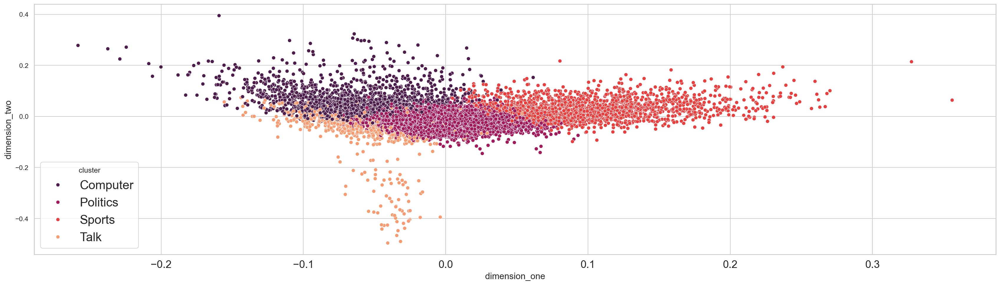

In [195]:
# visualizing the clusters formed after kmeans and pca
plt.clf()
sns.scatterplot(data=df_dimension_reduced_cluster, x='dimension_one', y='dimension_two', hue='cluster', palette="rocket")
plt.show()

### ✏️ Observe the results above and discuss the following:
- Which cluster appears to have the most overlap with other clusters, and why might this be the case?

A:
在圖中，「Politics」和「Talk」之間的重疊最多可能是因為這兩個主題在語言表達上有許多相似之處，例如討論中的泛用詞（如 "think"、"may"）和與人際交流相關的內容。

- Why do you think certain words, like "good" and "think," appear in multiple clusters? How could the presence of overlapping terms impact the interpretation of the clusters?

A:
"Good" 和 "Think" 是高頻出現的泛用詞，在不同的主題中都可能頻繁出現，特別是在討論性或評論性的文本中，這些詞的重疊可能降低群組的語義區別，使得某些群組看起來過於模糊或不夠具體。這會使解釋每個群組的核心特徵變得困難，因為難以找出獨特的標誌性詞彙。可以嘗試移除這些高頻的泛用詞（例如通過停用詞表）來提高聚類的語義純度。


- Why might some clusters have more generic terms (e.g., "space," "see," "may") while others are more domain-specific (e.g., "player," "team")?

A:
「Talk」和「Politics」可能涵蓋更廣泛的討論範疇，因此包含了更多通用的詞語。「Sports」和「Computer」則更專注於具體主題，這些主題有明確的專業術語和上下文。這種分佈反映了文本的主題範圍越廣，群組的語義越模糊，而主題範圍越窄，群組的語義越具體。

- How might these clustering results be applied in a real-world scenario, such as topic summarization or information retrieval?

A:
可以根據每個群組的高頻詞彙生成該群組的摘要，用於快速了解該主題的主要內容。分群結果可用於優化搜索引擎，將查詢匹配到最相關的群組以提高檢索精度。利用分群結果為用戶提供個性化的內容推薦，基於用戶偏好的主題標籤進行匹配。

- What methods could you use to quantitatively evaluate the quality of these clusters?

A:
Silhouette Score：評估群內樣本的緊密程度以及群之間的分離程度。
Cohesion and Separation：內聚性表示群內樣本的相似度，分離性表示群之間的距離。
Topical Coherence：檢查每個群組中高頻詞彙的語義一致性。


### 6.2.4 Word Cloud

Cluster Label: 0 Cluster Name: Talk


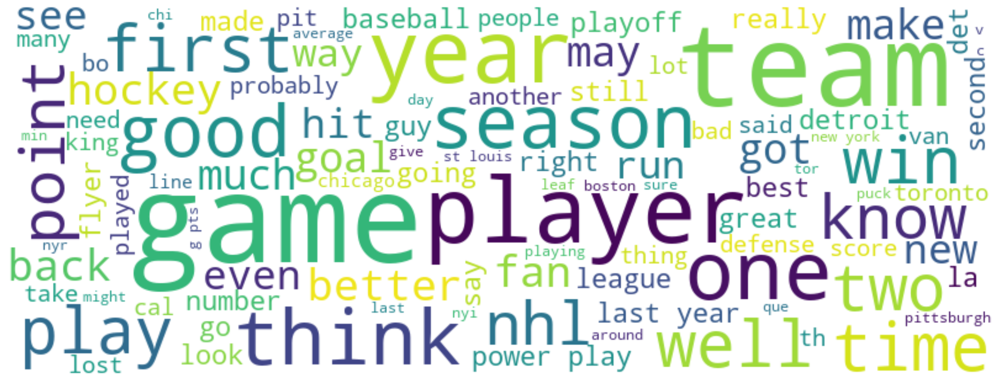

Cluster Label: 1 Cluster Name: Computer


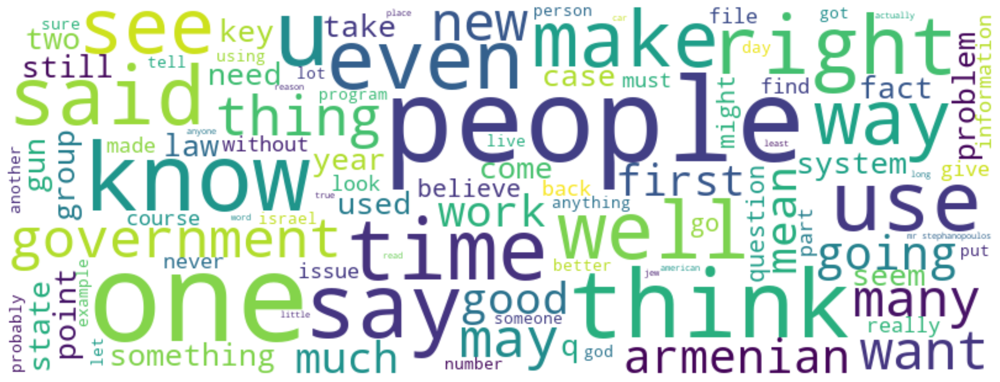

Cluster Label: 2 Cluster Name: Sports


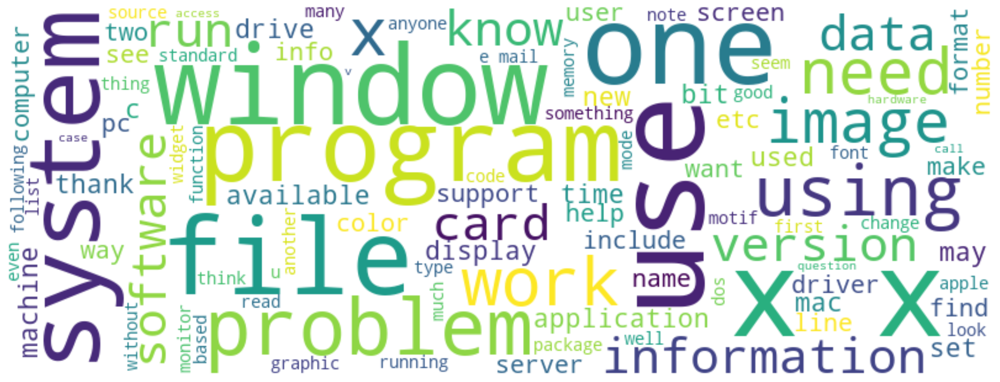

Cluster Label: 3 Cluster Name: Politics


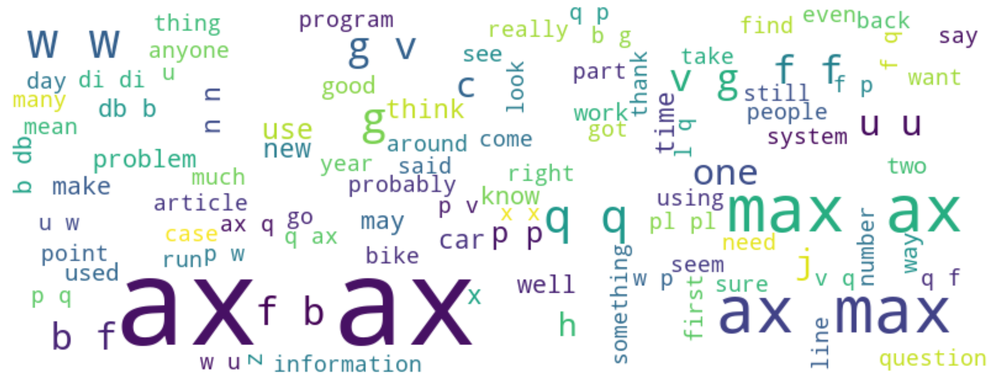

In [196]:
# viewing the wordcloud for each of the clusters
for k in range(0,chosen_k):
   df_matched_clusters=df_dimension_reduced_cluster[df_dimension_reduced_cluster['cluster_label']==k]
   text=df_matched_clusters['preprocessed_post'].str.cat(sep=' ')
   text=text.lower()
   text=' '.join([word for word in text.split()])
   wordcloud = WordCloud(width=800, height=300, max_font_size=100, max_words=100, background_color="white").generate(text)
   print(f'Cluster Label: {k} Cluster Name: {cluster_map[k]}')
   plt.figure()
   plt.imshow(wordcloud, interpolation="bilinear")
   plt.axis("off")
   plt.show()

The word cloud is created and visualized for each of the clusters. The words which are appearing repeatedly are big in size and the occurrence or importance of the word is directly proportional to the size of the word.

# Assignment 3

## 1. Discussion Questions
Answer the discussion questions above (those with ✏️ icon). Feel free to discuss and share your thoughts with your classmates.

## 2. Classification and Clustering Using Fine-tuned BERT
We previously explored fine-tuning a pre-trained BERT model for a text retrieval task in past lab exercises. Now, let’s take the next step and fine-tune BERT for a classification task.
- Fine-tune a Pre-trained BERT for Classification using the 20 Newsgroups Dataset:
  - Split the dataset into training, validation, and testing sets. Clearly explain the role of each dataset in the learning process.
- Analyze the Classification Results:
  - Perform both quantitative and qualitative analyses.
  - Quantitative Analysis: Plot a table comparing the classification results across different classifiers, including those covered in previous lab exercises.
  - Qualitative Analysis: Use methods such as attention score visualization, error analysis, or other approaches to provide insights into the model's performance.

## Bonus: Reproducing MIST for Short Text Clustering
The paper [MIST: Mutual Information Maximization for Short Text Clustering](https://aclanthology.org/2024.acl-long.610/) introduces a method to fine-tune a pre-trained BERT model by jointly optimizing a clustering loss and two representation learning losses. The authors have shared their source code on [GitHub](https://github.com/c4n/clustering_mist/). However, the source code is unorganized, and no documentation is provided.

Your task is to visit the GitHub repository and compile a Colab notebook to replicate the experiments using the **SearchSnippets** dataset. If the dataset is too large for your Colab account, you may use the **AgNews** dataset or a subset of the original dataset.

**Note:** You are **not required to write your own code from scratch** for this assignment. Instead, focus on understanding and organizing the provided code. The main challenge is to make the provided code functional. This includes:
- Fixing any errors or dependencies required to run the code.
- Organizing the unstructured code into a clear and runnable sequence in the Colab notebook.
- Adapting the code to work with the chosen dataset (e.g., SearchSnippets, AgNews, or a subset).

Once you successfully run the code, present the results in the Colab notebook, including:
- ACC and NMI on the target dataset, as reported by the authors in Table 1.



## 💻 Assignment Submission 💻
Write your responses to the discussion questions in this Jupyter Notebook. For assignment questions 2 and 3, create a Colab notebook and complete your work on it. Then, export these two notebooks as HTML files and submit both the Jupyter Notebooks and the HTML files to Cyber University. </br>
**Please ensure that the code is executed and the outputs are visible when exporting the HTML file.**